In [1]:
%load_ext autoreload
%autoreload 3

In [2]:
# ── Run-control flags ───────────────────────────────────────────────────────
FORCE_RERUN = False   # set True to recompute and overwrite pickles


In [3]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina' # high res plotting

import sys
sys.path.append('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikewise/spikewise')
sys.path.append(('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/'))
sys.path.append(('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikewise/Action potential waveforms are state-dependent paper/AP_empirical_paper_all_analyses/datasets/spe-1/spe1_helper_modules/'))
sys.path.append(('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikewise/Action potential waveforms are state-dependent paper/AP_empirical_paper_all_analyses/datasets/shared_helper_modules'))

# General imports
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm
import warnings
import pickle

warnings.filterwarnings(
    "ignore",
    message="use_inf_as_na option is deprecated",
    category=FutureWarning,
    module="seaborn")

warnings.filterwarnings(
    "ignore",
    message=r"invalid value encountered in log10",
    category=RuntimeWarning,
    module=r".*specparam.*",
)


# NeuroDSP and FOOOF modules
from neurodsp import spectral

from specparam import Bands


# Custom modules

from spk_feat_cluster_analysis import *

from spe1_plotting import *
from spikewise.patch.fit import Spike

from config import NPX_CHANNELS, CELL_IDS, DICT_PATCH_FS, DICT_CHAN_PRED, DICT_SPK_THRESH, FILTER_SETTINGS, SPE1_DATA_ROOT, SPE1_PICKLE_ROOT


In [4]:
cell_num = 5 #MODIFY THIS WHEN RUNNING DIFFERENT CELLS 

npx_fs = 30000 # sampling rate
lfp_fs = 3500 # sampling rate

patch_fs = DICT_PATCH_FS[cell_num ]
spk_thresh = DICT_SPK_THRESH[cell_num]

npx_channels = NPX_CHANNELS
npx_patch_channel = DICT_CHAN_PRED[cell_num ]



In [5]:
# Parameters
FORCE_CLUSTER = True   # re-cluster after removing decay duplicates (Sep 2026)


### Loading spe-1 data:

I moved the data loading steps to a separate Jupyter Notebook (spe-1_load_data)




## Cell   
### Analyze Gamma LFP and whole patch clamp AP relationship for cell 

## Step 0: Get loaded data 

In [6]:
lfp_dir = os.path.join(SPE1_DATA_ROOT, 'filt_lfp_recordings', f'c{cell_num}_lfp.npy')
patch_dir = os.path.join(SPE1_DATA_ROOT, 'filt_patch_recordings', f'c{cell_num}_patch.npy')


In [7]:
#get LFP data
lfp_filt = np.load(lfp_dir)
lfp_one_ms = float(lfp_fs / 1000)
lfp_times = np.arange(0, np.shape(lfp_filt)[0]) / lfp_one_ms # in ms instead of sec

#get patch data 
patch_filt = np.load(patch_dir)
patch_one_ms = float(patch_fs  / 1000)
patch_times = np.arange(0, np.shape(patch_filt )[0]) / patch_one_ms # in ms instead of sec

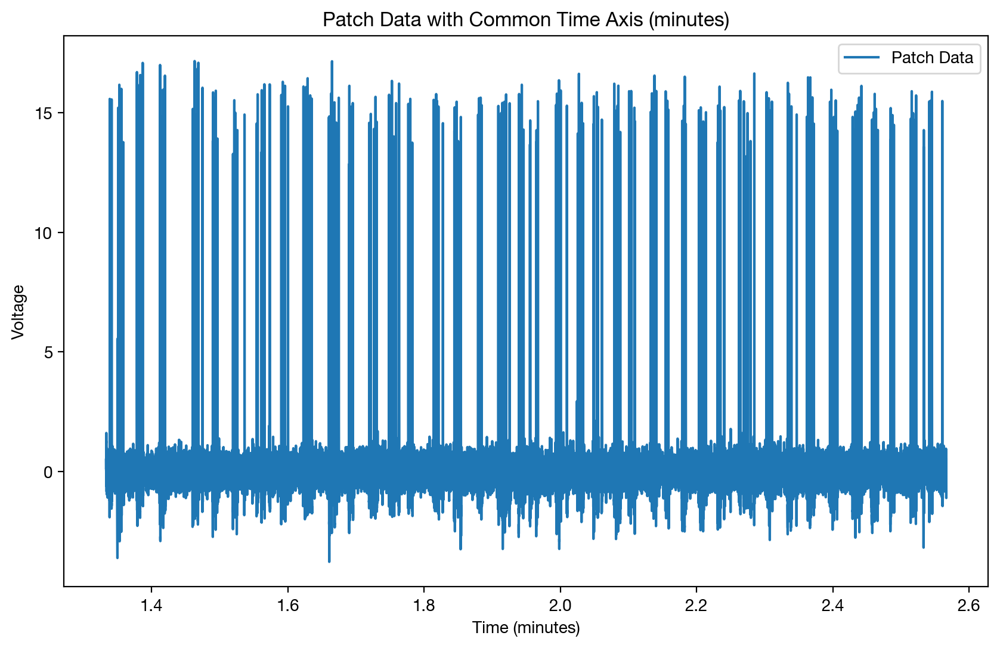

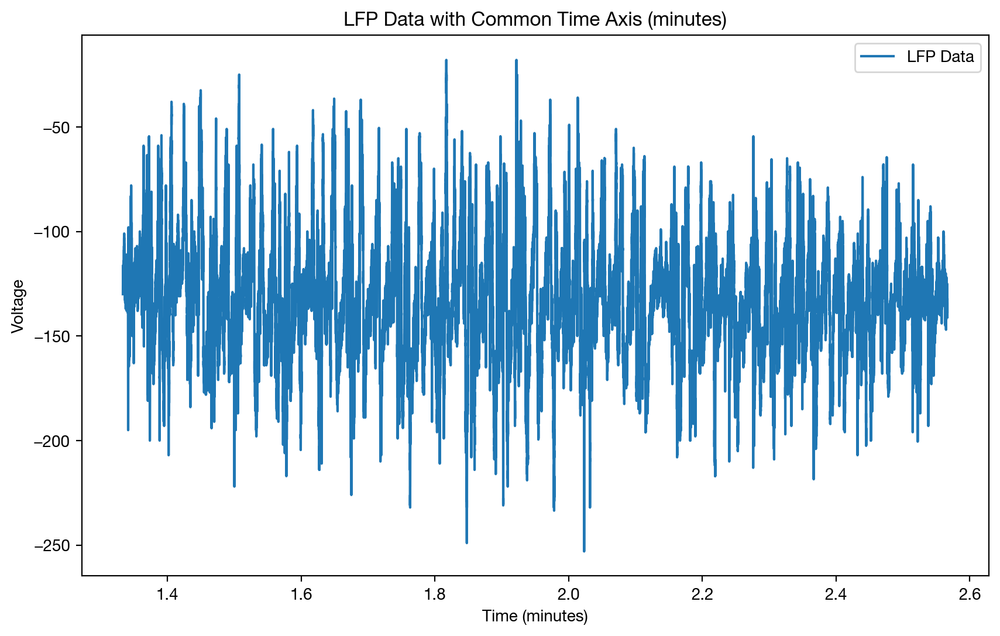

In [8]:
# Plot simultaneous patch and LFP data
# Convert time arrays to minutes
patch_times_min = patch_times / 60000  # Convert milliseconds to minutes
lfp_times_min = lfp_times / 60000  # Convert milliseconds to minutes

# Set the common time axis in minutes (e.g., from 13.3333 to 35.6667 minutes)
common_time_range_min = np.arange(80000 / 60000, 154000 / 60000, 1 / 60000)  # Adjust as needed

# Interpolate patch data onto the common time axis
patch_interp = np.interp(common_time_range_min, patch_times_min, patch_filt)

# Interpolate LFP data onto the common time axis
lfp_interp = np.interp(common_time_range_min, lfp_times_min, lfp_filt)

# Plot patch data with common time axis in minutes
plt.figure(figsize=(10, 6))
plt.plot(common_time_range_min, patch_interp, label='Patch Data')
plt.xlabel('Time (minutes)')
plt.ylabel('Voltage')
plt.title('Patch Data with Common Time Axis (minutes)')
plt.legend()
plt.show()

# Plot LFP data with common time axis in minutes
plt.figure(figsize=(10, 6))
plt.plot(common_time_range_min, lfp_interp, label='LFP Data')
plt.xlabel('Time (minutes)')
plt.ylabel('Voltage')
plt.title('LFP Data with Common Time Axis (minutes)')
plt.legend()
plt.show()

## STEP 1: Detect and fit spikes from patch data

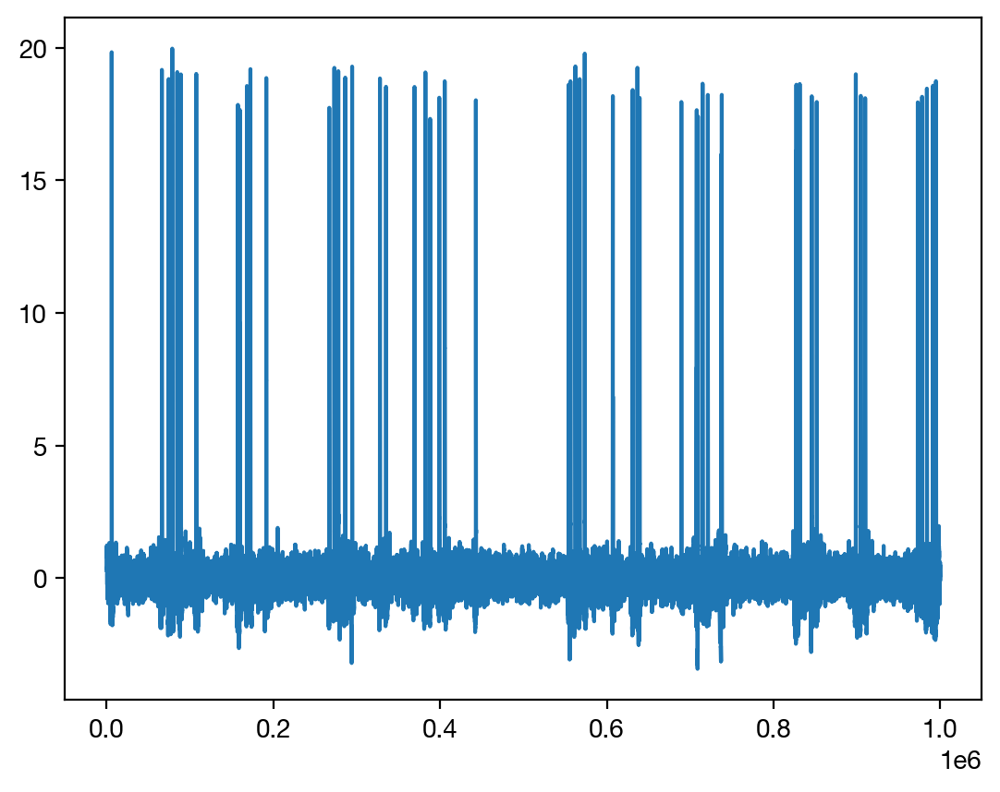

In [9]:
plt.plot(patch_filt[:1000000] )

In [10]:



#threshold in mVs
sp = Spike(thresh_amp=5, window_length=(5., 5.), smooth_frac=.01)

In [11]:

sp.fit(patch_filt, patch_fs, n_jobs=-1, progress=tqdm, flip_signal=False)

# Drop repeat detections on the decay of a preceding spike (see drop_decay_duplicates),
# then refit on the real spikes only
spike_inds, dropped = drop_decay_duplicates(patch_filt, sp.spike_inds, patch_fs, flip_signal=False)
print(f'Dropped {dropped.sum()} of {len(dropped)} detections as decay duplicates')
sp = Spike(thresh_amp=sp.thresh_amp, window_length=sp.window_length, smooth_frac=sp.smooth_frac)
sp.fit(patch_filt, patch_fs, spike_inds=spike_inds, n_jobs=-1, progress=tqdm, flip_signal=False)

Spike:   0%|          | 0/11873 [00:00<?, ?it/s]

Spike:   0%|          | 1/11873 [00:06<19:58:34,  6.06s/it]

Spike:   0%|          | 5/11873 [00:06<3:04:28,  1.07it/s] 

Spike:   0%|          | 25/11873 [00:06<27:07,  7.28it/s] 

Spike:   0%|          | 33/11873 [00:06<19:07, 10.31it/s]

Spike:   0%|          | 41/11873 [00:06<13:58, 14.12it/s]

Spike:   0%|          | 49/11873 [00:06<10:28, 18.81it/s]

Spike:   0%|          | 58/11873 [00:06<08:02, 24.48it/s]

Spike:   1%|          | 65/11873 [00:07<07:14, 27.19it/s]

Spike:   1%|          | 72/11873 [00:07<06:42, 29.30it/s]

Spike:   1%|          | 78/11873 [00:07<06:23, 30.78it/s]

Spike:   1%|          | 83/11873 [00:07<06:15, 31.36it/s]

Spike:   1%|          | 92/11873 [00:07<04:55, 39.88it/s]

Spike:   1%|          | 98/11873 [00:07<04:40, 41.93it/s]

Spike:   1%|          | 104/11873 [00:07<04:27, 43.97it/s]

Spike:   1%|          | 112/11873 [00:08<04:00, 48.92it/s]

Spike:   1%|          | 120/11873 [00:08<03:47, 51.73it/s]

Spike:   1%|          | 126/11873 [00:08<03:45, 52.17it/s]

Spike:   1%|          | 132/11873 [00:08<03:40, 53.25it/s]

Spike:   1%|          | 138/11873 [00:08<04:01, 48.68it/s]

Spike:   1%|          | 147/11873 [00:08<03:46, 51.77it/s]

Spike:   1%|▏         | 155/11873 [00:08<03:33, 54.94it/s]

Spike:   1%|▏         | 162/11873 [00:08<03:24, 57.27it/s]

Spike:   1%|▏         | 169/11873 [00:09<03:13, 60.35it/s]

Spike:   1%|▏         | 176/11873 [00:09<04:02, 48.29it/s]

Spike:   2%|▏         | 184/11873 [00:09<03:47, 51.38it/s]

Spike:   2%|▏         | 193/11873 [00:09<03:39, 53.19it/s]

Spike:   2%|▏         | 201/11873 [00:09<03:34, 54.48it/s]

Spike:   2%|▏         | 209/11873 [00:09<03:16, 59.30it/s]

Spike:   2%|▏         | 217/11873 [00:09<03:15, 59.73it/s]

Spike:   2%|▏         | 225/11873 [00:10<03:08, 61.95it/s]

Spike:   2%|▏         | 233/11873 [00:10<03:12, 60.62it/s]

Spike:   2%|▏         | 244/11873 [00:10<03:01, 64.04it/s]

Spike:   2%|▏         | 252/11873 [00:10<02:52, 67.48it/s]

Spike:   2%|▏         | 261/11873 [00:10<02:43, 70.89it/s]

Spike:   2%|▏         | 269/11873 [00:10<02:41, 71.71it/s]

Spike:   2%|▏         | 277/11873 [00:10<02:41, 71.75it/s]

Spike:   2%|▏         | 285/11873 [00:10<02:39, 72.64it/s]

Spike:   2%|▏         | 293/11873 [00:10<02:36, 73.93it/s]

Spike:   3%|▎         | 301/11873 [00:11<02:44, 70.46it/s]

Spike:   3%|▎         | 309/11873 [00:11<02:41, 71.43it/s]

Spike:   3%|▎         | 318/11873 [00:11<02:33, 75.24it/s]

Spike:   3%|▎         | 326/11873 [00:11<02:36, 73.61it/s]

Spike:   3%|▎         | 335/11873 [00:11<02:37, 73.14it/s]

Spike:   3%|▎         | 343/11873 [00:11<02:38, 72.61it/s]

Spike:   3%|▎         | 352/11873 [00:11<02:31, 75.84it/s]

Spike:   3%|▎         | 360/11873 [00:11<02:50, 67.48it/s]

Spike:   3%|▎         | 370/11873 [00:12<02:50, 67.54it/s]

Spike:   3%|▎         | 384/11873 [00:12<02:19, 82.11it/s]

Spike:   3%|▎         | 393/11873 [00:12<02:22, 80.50it/s]

Spike:   3%|▎         | 402/11873 [00:12<02:25, 79.09it/s]

Spike:   3%|▎         | 412/11873 [00:12<02:19, 82.35it/s]

Spike:   4%|▎         | 421/11873 [00:12<02:18, 82.41it/s]

Spike:   4%|▎         | 430/11873 [00:12<02:18, 82.35it/s]

Spike:   4%|▎         | 439/11873 [00:12<02:28, 76.88it/s]

Spike:   4%|▍         | 448/11873 [00:13<02:38, 71.92it/s]

Spike:   4%|▍         | 457/11873 [00:13<02:33, 74.24it/s]

Spike:   4%|▍         | 468/11873 [00:13<02:17, 82.95it/s]

Spike:   4%|▍         | 477/11873 [00:13<02:20, 81.29it/s]

Spike:   4%|▍         | 486/11873 [00:13<02:22, 79.76it/s]

Spike:   4%|▍         | 495/11873 [00:13<02:33, 73.96it/s]

Spike:   4%|▍         | 503/11873 [00:13<02:35, 73.13it/s]

Spike:   4%|▍         | 511/11873 [00:13<02:41, 70.44it/s]

Spike:   4%|▍         | 519/11873 [00:13<02:37, 72.17it/s]

Spike:   4%|▍         | 527/11873 [00:14<02:36, 72.58it/s]

Spike:   5%|▍         | 535/11873 [00:14<03:34, 52.84it/s]

Spike:   5%|▍         | 547/11873 [00:14<03:00, 62.82it/s]

Spike:   5%|▍         | 564/11873 [00:14<02:19, 81.17it/s]

Spike:   5%|▍         | 573/11873 [00:14<02:16, 82.76it/s]

Spike:   5%|▍         | 584/11873 [00:14<02:33, 73.44it/s]

Spike:   5%|▌         | 600/11873 [00:14<02:03, 91.53it/s]

Spike:   5%|▌         | 611/11873 [00:15<02:12, 85.10it/s]

Spike:   5%|▌         | 621/11873 [00:15<02:13, 84.27it/s]

Spike:   5%|▌         | 630/11873 [00:15<02:31, 74.07it/s]

Spike:   5%|▌         | 643/11873 [00:15<02:12, 84.67it/s]

Spike:   5%|▌         | 653/11873 [00:15<02:09, 86.35it/s]

Spike:   6%|▌         | 663/11873 [00:15<02:17, 81.45it/s]

Spike:   6%|▌         | 672/11873 [00:15<02:19, 80.37it/s]

Spike:   6%|▌         | 681/11873 [00:15<02:15, 82.46it/s]

Spike:   6%|▌         | 691/11873 [00:16<02:12, 84.20it/s]

Spike:   6%|▌         | 701/11873 [00:16<02:08, 86.94it/s]

Spike:   6%|▌         | 710/11873 [00:16<02:11, 84.71it/s]

Spike:   6%|▌         | 720/11873 [00:16<02:20, 79.34it/s]

Spike:   6%|▌         | 729/11873 [00:16<02:27, 75.41it/s]

Spike:   6%|▌         | 740/11873 [00:16<02:18, 80.22it/s]

Spike:   6%|▋         | 755/11873 [00:16<02:14, 82.48it/s]

Spike:   6%|▋         | 768/11873 [00:17<02:02, 90.61it/s]

Spike:   7%|▋         | 778/11873 [00:17<02:05, 88.59it/s]

Spike:   7%|▋         | 787/11873 [00:17<02:28, 74.70it/s]

Spike:   7%|▋         | 796/11873 [00:17<02:33, 72.06it/s]

Spike:   7%|▋         | 805/11873 [00:17<02:53, 63.77it/s]

Spike:   7%|▋         | 814/11873 [00:17<02:50, 64.73it/s]

Spike:   7%|▋         | 825/11873 [00:17<02:31, 72.81it/s]

Spike:   7%|▋         | 834/11873 [00:18<02:37, 70.27it/s]

Spike:   7%|▋         | 842/11873 [00:18<02:56, 62.36it/s]

Spike:   7%|▋         | 849/11873 [00:18<03:13, 57.01it/s]

Spike:   7%|▋         | 857/11873 [00:18<03:01, 60.68it/s]

Spike:   7%|▋         | 864/11873 [00:18<03:40, 49.98it/s]

Spike:   7%|▋         | 870/11873 [00:18<03:53, 47.10it/s]

Spike:   7%|▋         | 875/11873 [00:18<03:56, 46.55it/s]

Spike:   7%|▋         | 881/11873 [00:19<03:48, 48.14it/s]

Spike:   7%|▋         | 889/11873 [00:19<03:28, 52.62it/s]

Spike:   8%|▊         | 898/11873 [00:19<03:22, 54.13it/s]

Spike:   8%|▊         | 910/11873 [00:19<02:44, 66.80it/s]

Spike:   8%|▊         | 919/11873 [00:19<02:46, 65.83it/s]

Spike:   8%|▊         | 928/11873 [00:19<02:36, 70.11it/s]

Spike:   8%|▊         | 936/11873 [00:19<02:44, 66.30it/s]

Spike:   8%|▊         | 944/11873 [00:19<03:01, 60.09it/s]

Spike:   8%|▊         | 952/11873 [00:20<03:20, 54.43it/s]

Spike:   8%|▊         | 959/11873 [00:20<03:27, 52.51it/s]

Spike:   8%|▊         | 965/11873 [00:20<03:32, 51.42it/s]

Spike:   8%|▊         | 971/11873 [00:20<03:46, 48.04it/s]

Spike:   8%|▊         | 976/11873 [00:20<03:53, 46.70it/s]

Spike:   8%|▊         | 984/11873 [00:20<03:47, 47.92it/s]

Spike:   8%|▊         | 993/11873 [00:20<03:11, 56.67it/s]

Spike:   8%|▊         | 1001/11873 [00:21<03:05, 58.73it/s]

Spike:   9%|▊         | 1010/11873 [00:21<03:01, 59.73it/s]

Spike:   9%|▊         | 1018/11873 [00:21<02:51, 63.16it/s]

Spike:   9%|▊         | 1026/11873 [00:21<03:02, 59.31it/s]

Spike:   9%|▊         | 1035/11873 [00:21<03:03, 59.15it/s]

Spike:   9%|▉         | 1043/11873 [00:21<03:06, 57.99it/s]

Spike:   9%|▉         | 1051/11873 [00:21<03:11, 56.57it/s]

Spike:   9%|▉         | 1063/11873 [00:22<02:34, 70.06it/s]

Spike:   9%|▉         | 1071/11873 [00:22<02:40, 67.25it/s]

Spike:   9%|▉         | 1078/11873 [00:22<02:57, 60.92it/s]

Spike:   9%|▉         | 1085/11873 [00:22<02:54, 61.75it/s]

Spike:   9%|▉         | 1092/11873 [00:22<02:49, 63.44it/s]

Spike:   9%|▉         | 1099/11873 [00:22<02:49, 63.62it/s]

Spike:   9%|▉         | 1106/11873 [00:22<02:58, 60.47it/s]

Spike:   9%|▉         | 1113/11873 [00:22<03:23, 52.85it/s]

Spike:   9%|▉         | 1119/11873 [00:23<03:58, 45.10it/s]

Spike:   9%|▉         | 1124/11873 [00:23<04:23, 40.82it/s]

Spike:  10%|▉         | 1130/11873 [00:23<04:02, 44.30it/s]

Spike:  10%|▉         | 1137/11873 [00:23<03:58, 45.03it/s]

Spike:  10%|▉         | 1145/11873 [00:23<03:31, 50.66it/s]

Spike:  10%|▉         | 1152/11873 [00:23<03:40, 48.54it/s]

Spike:  10%|▉         | 1159/11873 [00:23<03:25, 52.03it/s]

Spike:  10%|▉         | 1167/11873 [00:24<03:13, 55.43it/s]

Spike:  10%|▉         | 1173/11873 [00:24<03:18, 53.77it/s]

Spike:  10%|▉         | 1179/11873 [00:24<03:59, 44.69it/s]

Spike:  10%|▉         | 1184/11873 [00:24<05:01, 35.40it/s]

Spike:  10%|█         | 1191/11873 [00:24<04:29, 39.67it/s]

Spike:  10%|█         | 1197/11873 [00:24<04:18, 41.37it/s]

Spike:  10%|█         | 1205/11873 [00:25<03:49, 46.53it/s]

Spike:  10%|█         | 1210/11873 [00:25<04:02, 44.00it/s]

Spike:  10%|█         | 1215/11873 [00:25<03:59, 44.44it/s]

Spike:  10%|█         | 1223/11873 [00:25<03:54, 45.41it/s]

Spike:  10%|█         | 1229/11873 [00:25<04:11, 42.30it/s]

Spike:  10%|█         | 1237/11873 [00:25<03:56, 45.04it/s]

Spike:  10%|█         | 1243/11873 [00:25<03:41, 47.95it/s]

Spike:  11%|█         | 1253/11873 [00:25<03:00, 58.93it/s]

Spike:  11%|█         | 1262/11873 [00:26<02:48, 62.86it/s]

Spike:  11%|█         | 1269/11873 [00:26<02:49, 62.49it/s]

Spike:  11%|█         | 1277/11873 [00:26<02:55, 60.49it/s]

Spike:  11%|█         | 1284/11873 [00:26<02:51, 61.82it/s]

Spike:  11%|█         | 1291/11873 [00:26<04:19, 40.73it/s]

Spike:  11%|█         | 1298/11873 [00:26<03:57, 44.60it/s]

Spike:  11%|█         | 1305/11873 [00:27<03:53, 45.24it/s]

Spike:  11%|█         | 1311/11873 [00:27<03:44, 47.10it/s]

Spike:  11%|█         | 1317/11873 [00:27<03:44, 47.08it/s]

Spike:  11%|█         | 1323/11873 [00:27<03:47, 46.27it/s]

Spike:  11%|█         | 1328/11873 [00:27<04:12, 41.78it/s]

Spike:  11%|█         | 1333/11873 [00:27<04:27, 39.44it/s]

Spike:  11%|█▏        | 1339/11873 [00:27<04:18, 40.69it/s]

Spike:  11%|█▏        | 1344/11873 [00:28<05:23, 32.54it/s]

Spike:  11%|█▏        | 1348/11873 [00:28<05:12, 33.64it/s]

Spike:  11%|█▏        | 1352/11873 [00:28<05:18, 33.04it/s]

Spike:  11%|█▏        | 1358/11873 [00:28<04:57, 35.30it/s]

Spike:  12%|█▏        | 1366/11873 [00:28<04:00, 43.60it/s]

Spike:  12%|█▏        | 1371/11873 [00:28<04:15, 41.05it/s]

Spike:  12%|█▏        | 1376/11873 [00:28<05:04, 34.46it/s]

Spike:  12%|█▏        | 1382/11873 [00:29<04:55, 35.56it/s]

Spike:  12%|█▏        | 1390/11873 [00:29<04:24, 39.61it/s]

Spike:  12%|█▏        | 1405/11873 [00:29<03:11, 54.78it/s]

Spike:  12%|█▏        | 1413/11873 [00:29<03:11, 54.65it/s]

Spike:  12%|█▏        | 1421/11873 [00:29<03:16, 53.21it/s]

Spike:  12%|█▏        | 1429/11873 [00:29<02:57, 58.75it/s]

Spike:  12%|█▏        | 1436/11873 [00:29<02:56, 59.14it/s]

Spike:  12%|█▏        | 1443/11873 [00:30<02:55, 59.34it/s]

Spike:  12%|█▏        | 1452/11873 [00:30<02:37, 66.13it/s]

Spike:  12%|█▏        | 1459/11873 [00:30<03:11, 54.42it/s]

Spike:  12%|█▏        | 1465/11873 [00:30<03:11, 54.30it/s]

Spike:  12%|█▏        | 1472/11873 [00:30<03:06, 55.85it/s]

Spike:  12%|█▏        | 1479/11873 [00:30<03:00, 57.70it/s]

Spike:  13%|█▎        | 1485/11873 [00:30<03:32, 48.84it/s]

Spike:  13%|█▎        | 1491/11873 [00:31<03:38, 47.51it/s]

Spike:  13%|█▎        | 1498/11873 [00:31<03:25, 50.58it/s]

Spike:  13%|█▎        | 1506/11873 [00:31<03:05, 55.87it/s]

Spike:  13%|█▎        | 1512/11873 [00:31<03:08, 54.97it/s]

Spike:  13%|█▎        | 1518/11873 [00:31<04:13, 40.81it/s]

Spike:  13%|█▎        | 1525/11873 [00:31<03:58, 43.30it/s]

Spike:  13%|█▎        | 1531/11873 [00:31<04:02, 42.73it/s]

Spike:  13%|█▎        | 1536/11873 [00:32<04:18, 39.97it/s]

Spike:  13%|█▎        | 1541/11873 [00:32<05:05, 33.78it/s]

Spike:  13%|█▎        | 1545/11873 [00:32<05:16, 32.64it/s]

Spike:  13%|█▎        | 1549/11873 [00:32<05:43, 30.06it/s]

Spike:  13%|█▎        | 1554/11873 [00:32<05:23, 31.89it/s]

Spike:  13%|█▎        | 1558/11873 [00:32<05:07, 33.51it/s]

Spike:  13%|█▎        | 1562/11873 [00:32<04:55, 34.93it/s]

Spike:  13%|█▎        | 1570/11873 [00:33<03:46, 45.54it/s]

Spike:  13%|█▎        | 1575/11873 [00:33<03:53, 44.03it/s]

Spike:  13%|█▎        | 1580/11873 [00:33<05:33, 30.84it/s]

Spike:  13%|█▎        | 1587/11873 [00:33<05:04, 33.80it/s]

Spike:  13%|█▎        | 1596/11873 [00:33<03:53, 44.00it/s]

Spike:  13%|█▎        | 1602/11873 [00:33<03:46, 45.41it/s]

Spike:  14%|█▎        | 1608/11873 [00:33<03:41, 46.35it/s]

Spike:  14%|█▎        | 1614/11873 [00:34<03:42, 46.16it/s]

Spike:  14%|█▎        | 1621/11873 [00:34<03:35, 47.60it/s]

Spike:  14%|█▎        | 1628/11873 [00:34<03:25, 49.80it/s]

Spike:  14%|█▍        | 1636/11873 [00:34<03:04, 55.37it/s]

Spike:  14%|█▍        | 1642/11873 [00:34<03:02, 56.17it/s]

Spike:  14%|█▍        | 1648/11873 [00:34<03:30, 48.61it/s]

Spike:  14%|█▍        | 1654/11873 [00:34<03:47, 44.91it/s]

Spike:  14%|█▍        | 1660/11873 [00:35<03:38, 46.75it/s]

Spike:  14%|█▍        | 1668/11873 [00:35<03:27, 49.27it/s]

Spike:  14%|█▍        | 1677/11873 [00:35<03:09, 53.82it/s]

Spike:  14%|█▍        | 1683/11873 [00:35<03:07, 54.43it/s]

Spike:  14%|█▍        | 1689/11873 [00:35<03:02, 55.78it/s]

Spike:  14%|█▍        | 1696/11873 [00:35<02:58, 57.10it/s]

Spike:  14%|█▍        | 1703/11873 [00:35<02:50, 59.77it/s]

Spike:  14%|█▍        | 1710/11873 [00:35<02:50, 59.66it/s]

Spike:  14%|█▍        | 1718/11873 [00:35<02:41, 63.06it/s]

Spike:  15%|█▍        | 1725/11873 [00:36<02:43, 61.90it/s]

Spike:  15%|█▍        | 1732/11873 [00:36<02:40, 63.07it/s]

Spike:  15%|█▍        | 1739/11873 [00:36<02:36, 64.86it/s]

Spike:  15%|█▍        | 1746/11873 [00:36<02:38, 63.77it/s]

Spike:  15%|█▍        | 1753/11873 [00:36<03:25, 49.25it/s]

Spike:  15%|█▍        | 1760/11873 [00:36<03:14, 52.09it/s]

Spike:  15%|█▍        | 1766/11873 [00:36<03:22, 50.02it/s]

Spike:  15%|█▍        | 1773/11873 [00:36<03:08, 53.57it/s]

Spike:  15%|█▍        | 1780/11873 [00:37<03:12, 52.48it/s]

Spike:  15%|█▌        | 1788/11873 [00:37<03:13, 52.02it/s]

Spike:  15%|█▌        | 1796/11873 [00:37<03:12, 52.43it/s]

Spike:  15%|█▌        | 1804/11873 [00:37<03:06, 54.13it/s]

Spike:  15%|█▌        | 1812/11873 [00:37<03:08, 53.27it/s]

Spike:  15%|█▌        | 1820/11873 [00:37<02:53, 58.01it/s]

Spike:  15%|█▌        | 1828/11873 [00:37<02:46, 60.42it/s]

Spike:  15%|█▌        | 1836/11873 [00:38<02:52, 58.13it/s]

Spike:  16%|█▌        | 1844/11873 [00:38<02:53, 57.77it/s]

Spike:  16%|█▌        | 1854/11873 [00:38<02:29, 67.01it/s]

Spike:  16%|█▌        | 1861/11873 [00:38<02:33, 65.27it/s]

Spike:  16%|█▌        | 1868/11873 [00:38<02:49, 58.89it/s]

Spike:  16%|█▌        | 1876/11873 [00:38<02:36, 63.77it/s]

Spike:  16%|█▌        | 1884/11873 [00:38<02:32, 65.61it/s]

Spike:  16%|█▌        | 1891/11873 [00:38<02:47, 59.69it/s]

Spike:  16%|█▌        | 1899/11873 [00:39<03:03, 54.25it/s]

Spike:  16%|█▌        | 1905/11873 [00:39<03:27, 48.05it/s]

Spike:  16%|█▌        | 1911/11873 [00:39<04:18, 38.60it/s]

Spike:  16%|█▌        | 1916/11873 [00:39<04:17, 38.60it/s]

Spike:  16%|█▌        | 1924/11873 [00:39<05:11, 31.93it/s]

Spike:  16%|█▋        | 1932/11873 [00:40<04:27, 37.14it/s]

Spike:  16%|█▋        | 1940/11873 [00:40<03:56, 42.05it/s]

Spike:  16%|█▋        | 1945/11873 [00:40<04:08, 39.98it/s]

Spike:  16%|█▋        | 1952/11873 [00:40<03:54, 42.25it/s]

Spike:  17%|█▋        | 1961/11873 [00:40<03:11, 51.87it/s]

Spike:  17%|█▋        | 1967/11873 [00:40<03:10, 51.90it/s]

Spike:  17%|█▋        | 1973/11873 [00:40<03:11, 51.63it/s]

Spike:  17%|█▋        | 1980/11873 [00:41<03:14, 50.82it/s]

Spike:  17%|█▋        | 1989/11873 [00:41<02:44, 60.21it/s]

Spike:  17%|█▋        | 1996/11873 [00:41<03:15, 50.50it/s]

Spike:  17%|█▋        | 2003/11873 [00:41<02:59, 54.92it/s]

Spike:  17%|█▋        | 2009/11873 [00:41<03:14, 50.66it/s]

Spike:  17%|█▋        | 2018/11873 [00:41<03:02, 53.93it/s]

Spike:  17%|█▋        | 2026/11873 [00:41<02:45, 59.51it/s]

Spike:  17%|█▋        | 2034/11873 [00:41<02:33, 64.19it/s]

Spike:  17%|█▋        | 2041/11873 [00:42<02:41, 60.94it/s]

Spike:  17%|█▋        | 2048/11873 [00:42<02:42, 60.63it/s]

Spike:  17%|█▋        | 2055/11873 [00:42<03:00, 54.48it/s]

Spike:  17%|█▋        | 2062/11873 [00:42<02:57, 55.16it/s]

Spike:  17%|█▋        | 2069/11873 [00:42<02:54, 56.06it/s]

Spike:  18%|█▊        | 2078/11873 [00:42<02:39, 61.22it/s]

Spike:  18%|█▊        | 2085/11873 [00:42<02:37, 62.13it/s]

Spike:  18%|█▊        | 2092/11873 [00:42<02:57, 54.98it/s]

Spike:  18%|█▊        | 2098/11873 [00:43<03:13, 50.39it/s]

Spike:  18%|█▊        | 2106/11873 [00:43<02:59, 54.29it/s]

Spike:  18%|█▊        | 2114/11873 [00:43<03:11, 51.02it/s]

Spike:  18%|█▊        | 2123/11873 [00:43<02:47, 58.38it/s]

Spike:  18%|█▊        | 2131/11873 [00:43<02:50, 57.27it/s]

Spike:  18%|█▊        | 2138/11873 [00:43<02:42, 60.07it/s]

Spike:  18%|█▊        | 2145/11873 [00:43<02:41, 60.20it/s]

Spike:  18%|█▊        | 2152/11873 [00:44<02:55, 55.41it/s]

Spike:  18%|█▊        | 2158/11873 [00:44<02:56, 55.11it/s]

Spike:  18%|█▊        | 2164/11873 [00:44<03:23, 47.80it/s]

Spike:  18%|█▊        | 2171/11873 [00:44<03:41, 43.71it/s]

Spike:  18%|█▊        | 2179/11873 [00:44<03:23, 47.62it/s]

Spike:  18%|█▊        | 2185/11873 [00:44<03:17, 49.15it/s]

Spike:  18%|█▊        | 2194/11873 [00:44<03:07, 51.55it/s]

Spike:  19%|█▊        | 2201/11873 [00:45<03:02, 53.01it/s]

Spike:  19%|█▊        | 2210/11873 [00:45<02:43, 58.98it/s]

Spike:  19%|█▊        | 2220/11873 [00:45<02:31, 63.54it/s]

Spike:  19%|█▉        | 2228/11873 [00:45<02:30, 64.10it/s]

Spike:  19%|█▉        | 2235/11873 [00:45<02:32, 63.03it/s]

Spike:  19%|█▉        | 2247/11873 [00:45<02:08, 74.99it/s]

Spike:  19%|█▉        | 2257/11873 [00:45<02:06, 76.19it/s]

Spike:  19%|█▉        | 2265/11873 [00:45<02:10, 73.43it/s]

Spike:  19%|█▉        | 2273/11873 [00:46<02:11, 72.87it/s]

Spike:  19%|█▉        | 2281/11873 [00:46<02:09, 73.95it/s]

Spike:  19%|█▉        | 2289/11873 [00:46<02:32, 62.98it/s]

Spike:  19%|█▉        | 2296/11873 [00:46<02:39, 60.21it/s]

Spike:  19%|█▉        | 2304/11873 [00:46<02:32, 62.82it/s]

Spike:  19%|█▉        | 2313/11873 [00:46<02:18, 69.21it/s]

Spike:  20%|█▉        | 2323/11873 [00:46<02:05, 75.91it/s]

Spike:  20%|█▉        | 2332/11873 [00:46<02:03, 77.26it/s]

Spike:  20%|█▉        | 2340/11873 [00:46<02:08, 74.15it/s]

Spike:  20%|█▉        | 2348/11873 [00:47<02:14, 70.71it/s]

Spike:  20%|█▉        | 2363/11873 [00:47<01:51, 85.16it/s]

Spike:  20%|█▉        | 2372/11873 [00:47<01:56, 81.52it/s]

Spike:  20%|██        | 2381/11873 [00:47<01:53, 83.46it/s]

Spike:  20%|██        | 2390/11873 [00:47<01:52, 84.07it/s]

Spike:  20%|██        | 2399/11873 [00:47<01:56, 81.32it/s]

Spike:  20%|██        | 2413/11873 [00:47<01:52, 83.85it/s]

Spike:  20%|██        | 2422/11873 [00:47<01:54, 82.57it/s]

Spike:  20%|██        | 2433/11873 [00:48<01:45, 89.53it/s]

Spike:  21%|██        | 2443/11873 [00:48<01:43, 91.28it/s]

Spike:  21%|██        | 2453/11873 [00:48<01:52, 83.85it/s]

Spike:  21%|██        | 2463/11873 [00:48<01:56, 80.46it/s]

Spike:  21%|██        | 2472/11873 [00:48<02:02, 76.61it/s]

Spike:  21%|██        | 2486/11873 [00:48<01:58, 79.28it/s]

Spike:  21%|██        | 2499/11873 [00:48<01:47, 87.16it/s]

Spike:  21%|██        | 2510/11873 [00:49<01:48, 86.28it/s]

Spike:  21%|██        | 2519/11873 [00:49<01:52, 83.04it/s]

Spike:  21%|██▏       | 2533/11873 [00:49<01:40, 92.97it/s]

Spike:  21%|██▏       | 2543/11873 [00:49<01:44, 89.01it/s]

Spike:  21%|██▏       | 2552/11873 [00:49<01:50, 84.07it/s]

Spike:  22%|██▏       | 2563/11873 [00:49<01:45, 88.36it/s]

Spike:  22%|██▏       | 2574/11873 [00:49<01:39, 93.74it/s]

Spike:  22%|██▏       | 2584/11873 [00:49<01:50, 83.81it/s]

Spike:  22%|██▏       | 2594/11873 [00:49<01:53, 81.46it/s]

Spike:  22%|██▏       | 2604/11873 [00:50<01:52, 82.20it/s]

Spike:  22%|██▏       | 2615/11873 [00:50<01:54, 80.79it/s]

Spike:  22%|██▏       | 2625/11873 [00:50<01:52, 82.33it/s]

Spike:  22%|██▏       | 2637/11873 [00:50<01:46, 86.98it/s]

Spike:  22%|██▏       | 2650/11873 [00:50<01:43, 89.22it/s]

Spike:  22%|██▏       | 2659/11873 [00:50<01:45, 87.38it/s]

Spike:  22%|██▏       | 2668/11873 [00:50<01:55, 79.59it/s]

Spike:  23%|██▎       | 2679/11873 [00:50<01:45, 87.17it/s]

Spike:  23%|██▎       | 2688/11873 [00:51<01:49, 83.76it/s]

Spike:  23%|██▎       | 2699/11873 [00:51<01:42, 89.07it/s]

Spike:  23%|██▎       | 2709/11873 [00:51<01:56, 78.84it/s]

Spike:  23%|██▎       | 2722/11873 [00:51<01:56, 78.86it/s]

Spike:  23%|██▎       | 2737/11873 [00:51<01:36, 95.01it/s]

Spike:  23%|██▎       | 2748/11873 [00:51<01:46, 86.07it/s]

Spike:  23%|██▎       | 2759/11873 [00:51<01:43, 88.10it/s]

Spike:  23%|██▎       | 2769/11873 [00:52<02:02, 74.11it/s]

Spike:  23%|██▎       | 2783/11873 [00:52<01:46, 85.20it/s]

Spike:  24%|██▎       | 2793/11873 [00:52<01:43, 87.71it/s]

Spike:  24%|██▎       | 2803/11873 [00:52<01:48, 83.56it/s]

Spike:  24%|██▎       | 2814/11873 [00:52<01:44, 86.36it/s]

Spike:  24%|██▍       | 2823/11873 [00:52<01:58, 76.65it/s]

Spike:  24%|██▍       | 2831/11873 [00:52<02:07, 70.82it/s]

Spike:  24%|██▍       | 2839/11873 [00:53<02:25, 62.16it/s]

Spike:  24%|██▍       | 2846/11873 [00:53<02:27, 61.04it/s]

Spike:  24%|██▍       | 2853/11873 [00:53<02:37, 57.45it/s]

Spike:  24%|██▍       | 2859/11873 [00:53<02:54, 51.57it/s]

Spike:  24%|██▍       | 2865/11873 [00:53<02:55, 51.19it/s]

Spike:  24%|██▍       | 2871/11873 [00:53<02:52, 52.07it/s]

Spike:  24%|██▍       | 2879/11873 [00:53<02:51, 52.30it/s]

Spike:  24%|██▍       | 2885/11873 [00:53<02:52, 52.08it/s]

Spike:  24%|██▍       | 2891/11873 [00:54<03:00, 49.69it/s]

Spike:  24%|██▍       | 2896/11873 [00:54<03:27, 43.34it/s]

Spike:  24%|██▍       | 2902/11873 [00:54<03:18, 45.21it/s]

Spike:  24%|██▍       | 2907/11873 [00:54<03:44, 39.86it/s]

Spike:  25%|██▍       | 2916/11873 [00:54<03:07, 47.87it/s]

Spike:  25%|██▍       | 2923/11873 [00:54<03:02, 49.11it/s]

Spike:  25%|██▍       | 2929/11873 [00:54<03:23, 44.04it/s]

Spike:  25%|██▍       | 2936/11873 [00:55<03:01, 49.29it/s]

Spike:  25%|██▍       | 2942/11873 [00:55<03:11, 46.68it/s]

Spike:  25%|██▍       | 2949/11873 [00:55<03:09, 47.12it/s]

Spike:  25%|██▍       | 2957/11873 [00:55<02:55, 50.72it/s]

Spike:  25%|██▍       | 2963/11873 [00:55<03:00, 49.40it/s]

Spike:  25%|██▌       | 2969/11873 [00:55<03:32, 41.95it/s]

Spike:  25%|██▌       | 2974/11873 [00:55<03:40, 40.38it/s]

Spike:  25%|██▌       | 2980/11873 [00:56<03:22, 43.86it/s]

Spike:  25%|██▌       | 2988/11873 [00:56<02:49, 52.30it/s]

Spike:  25%|██▌       | 2996/11873 [00:56<02:44, 54.08it/s]

Spike:  25%|██▌       | 3004/11873 [00:56<02:30, 59.04it/s]

Spike:  25%|██▌       | 3014/11873 [00:56<02:08, 69.12it/s]

Spike:  25%|██▌       | 3022/11873 [00:56<02:04, 71.29it/s]

Spike:  26%|██▌       | 3030/11873 [00:56<02:10, 68.00it/s]

Spike:  26%|██▌       | 3039/11873 [00:56<02:09, 68.31it/s]

Spike:  26%|██▌       | 3050/11873 [00:57<02:16, 64.55it/s]

Spike:  26%|██▌       | 3058/11873 [00:57<02:10, 67.58it/s]

Spike:  26%|██▌       | 3065/11873 [00:57<02:22, 61.92it/s]

Spike:  26%|██▌       | 3072/11873 [00:57<02:53, 50.82it/s]

Spike:  26%|██▌       | 3078/11873 [00:57<03:24, 43.00it/s]

Spike:  26%|██▌       | 3085/11873 [00:57<03:19, 44.13it/s]

Spike:  26%|██▌       | 3096/11873 [00:58<02:41, 54.34it/s]

Spike:  26%|██▌       | 3104/11873 [00:58<02:31, 58.04it/s]

Spike:  26%|██▌       | 3112/11873 [00:58<02:23, 61.10it/s]

Spike:  26%|██▋       | 3121/11873 [00:58<02:17, 63.50it/s]

Spike:  26%|██▋       | 3130/11873 [00:58<02:07, 68.62it/s]

Spike:  26%|██▋       | 3141/11873 [00:58<01:58, 73.62it/s]

Spike:  27%|██▋       | 3152/11873 [00:58<02:42, 53.68it/s]

Spike:  27%|██▋       | 3166/11873 [00:59<02:09, 67.28it/s]

Spike:  27%|██▋       | 3182/11873 [00:59<01:42, 84.70it/s]

Spike:  27%|██▋       | 3198/11873 [00:59<01:25, 101.38it/s]

Spike:  27%|██▋       | 3210/11873 [00:59<01:29, 96.62it/s] 

Spike:  27%|██▋       | 3225/11873 [00:59<01:23, 103.96it/s]

Spike:  27%|██▋       | 3242/11873 [00:59<01:13, 117.94it/s]

Spike:  27%|██▋       | 3258/11873 [00:59<01:08, 125.31it/s]

Spike:  28%|██▊       | 3273/11873 [00:59<01:07, 127.04it/s]

Spike:  28%|██▊       | 3290/11873 [00:59<01:02, 136.93it/s]

Spike:  28%|██▊       | 3305/11873 [01:00<01:03, 134.67it/s]

Spike:  28%|██▊       | 3319/11873 [01:00<01:12, 118.39it/s]

Spike:  28%|██▊       | 3332/11873 [01:00<01:14, 115.35it/s]

Spike:  28%|██▊       | 3344/11873 [01:00<01:15, 112.65it/s]

Spike:  28%|██▊       | 3356/11873 [01:00<01:26, 98.93it/s] 

Spike:  28%|██▊       | 3367/11873 [01:00<01:40, 84.88it/s]

Spike:  28%|██▊       | 3377/11873 [01:00<01:39, 85.37it/s]

Spike:  29%|██▊       | 3386/11873 [01:01<01:50, 77.12it/s]

Spike:  29%|██▊       | 3395/11873 [01:01<01:46, 79.46it/s]

Spike:  29%|██▊       | 3407/11873 [01:01<01:37, 86.41it/s]

Spike:  29%|██▉       | 3423/11873 [01:01<01:26, 97.25it/s]

Spike:  29%|██▉       | 3437/11873 [01:01<01:19, 106.71it/s]

Spike:  29%|██▉       | 3448/11873 [01:01<01:22, 101.87it/s]

Spike:  29%|██▉       | 3459/11873 [01:01<01:25, 98.76it/s] 

Spike:  29%|██▉       | 3469/11873 [01:01<01:29, 93.74it/s]

Spike:  29%|██▉       | 3479/11873 [01:02<01:45, 79.84it/s]

Spike:  29%|██▉       | 3488/11873 [01:02<01:46, 78.61it/s]

Spike:  29%|██▉       | 3497/11873 [01:02<02:13, 62.56it/s]

Spike:  30%|██▉       | 3511/11873 [01:02<01:45, 79.00it/s]

Spike:  30%|██▉       | 3521/11873 [01:02<01:40, 83.28it/s]

Spike:  30%|██▉       | 3531/11873 [01:02<01:47, 77.39it/s]

Spike:  30%|██▉       | 3544/11873 [01:02<01:33, 89.17it/s]

Spike:  30%|██▉       | 3557/11873 [01:02<01:27, 95.18it/s]

Spike:  30%|███       | 3572/11873 [01:03<01:16, 108.64it/s]

Spike:  30%|███       | 3584/11873 [01:03<01:19, 104.91it/s]

Spike:  30%|███       | 3595/11873 [01:03<01:25, 97.13it/s] 

Spike:  30%|███       | 3609/11873 [01:03<01:17, 106.12it/s]

Spike:  30%|███       | 3620/11873 [01:03<01:19, 103.25it/s]

Spike:  31%|███       | 3631/11873 [01:03<01:23, 98.35it/s] 

Spike:  31%|███       | 3642/11873 [01:03<01:26, 94.84it/s]

Spike:  31%|███       | 3652/11873 [01:03<01:35, 85.90it/s]

Spike:  31%|███       | 3661/11873 [01:04<01:40, 81.50it/s]

Spike:  31%|███       | 3670/11873 [01:04<01:50, 74.48it/s]

Spike:  31%|███       | 3684/11873 [01:04<01:31, 89.85it/s]

Spike:  31%|███       | 3697/11873 [01:04<01:22, 98.82it/s]

Spike:  31%|███▏      | 3713/11873 [01:04<01:11, 113.54it/s]

Spike:  31%|███▏      | 3728/11873 [01:04<01:08, 118.14it/s]

Spike:  32%|███▏      | 3744/11873 [01:04<01:03, 128.61it/s]

Spike:  32%|███▏      | 3758/11873 [01:04<01:03, 128.60it/s]

Spike:  32%|███▏      | 3772/11873 [01:04<01:02, 128.64it/s]

Spike:  32%|███▏      | 3786/11873 [01:05<01:12, 112.31it/s]

Spike:  32%|███▏      | 3798/11873 [01:05<01:19, 101.73it/s]

Spike:  32%|███▏      | 3810/11873 [01:05<01:18, 102.77it/s]

Spike:  32%|███▏      | 3821/11873 [01:05<01:19, 101.26it/s]

Spike:  32%|███▏      | 3832/11873 [01:05<01:21, 99.12it/s] 

Spike:  32%|███▏      | 3843/11873 [01:05<01:19, 101.13it/s]

Spike:  32%|███▏      | 3854/11873 [01:05<01:20, 99.10it/s] 

Spike:  33%|███▎      | 3864/11873 [01:05<01:21, 98.13it/s]

Spike:  33%|███▎      | 3874/11873 [01:06<01:28, 90.61it/s]

Spike:  33%|███▎      | 3888/11873 [01:06<01:17, 103.28it/s]

Spike:  33%|███▎      | 3899/11873 [01:06<01:18, 101.40it/s]

Spike:  33%|███▎      | 3910/11873 [01:06<01:17, 102.80it/s]

Spike:  33%|███▎      | 3925/11873 [01:06<01:08, 115.52it/s]

Spike:  33%|███▎      | 3937/11873 [01:06<01:09, 114.30it/s]

Spike:  33%|███▎      | 3952/11873 [01:06<01:08, 115.88it/s]

Spike:  33%|███▎      | 3964/11873 [01:06<01:12, 109.70it/s]

Spike:  34%|███▎      | 3981/11873 [01:06<01:03, 124.94it/s]

Spike:  34%|███▎      | 3995/11873 [01:07<01:02, 126.60it/s]

Spike:  34%|███▍      | 4013/11873 [01:07<00:58, 133.46it/s]

Spike:  34%|███▍      | 4031/11873 [01:07<00:55, 142.42it/s]

Spike:  34%|███▍      | 4046/11873 [01:07<01:16, 101.95it/s]

Spike:  34%|███▍      | 4071/11873 [01:07<00:59, 130.24it/s]

Spike:  34%|███▍      | 4086/11873 [01:07<01:04, 121.62it/s]

Spike:  35%|███▍      | 4100/11873 [01:08<01:13, 105.63it/s]

Spike:  35%|███▍      | 4112/11873 [01:08<01:11, 108.10it/s]

Spike:  35%|███▍      | 4124/11873 [01:08<01:15, 102.87it/s]

Spike:  35%|███▍      | 4140/11873 [01:08<01:06, 115.68it/s]

Spike:  35%|███▍      | 4153/11873 [01:08<01:09, 110.74it/s]

Spike:  35%|███▌      | 4169/11873 [01:08<01:03, 121.41it/s]

Spike:  35%|███▌      | 4185/11873 [01:08<01:01, 124.92it/s]

Spike:  35%|███▌      | 4204/11873 [01:08<00:57, 133.88it/s]

Spike:  36%|███▌      | 4221/11873 [01:08<00:53, 141.75it/s]

Spike:  36%|███▌      | 4236/11873 [01:09<00:53, 141.79it/s]

Spike:  36%|███▌      | 4252/11873 [01:09<00:52, 146.51it/s]

Spike:  36%|███▌      | 4269/11873 [01:09<00:52, 144.60it/s]

Spike:  36%|███▌      | 4286/11873 [01:09<00:50, 150.27it/s]

Spike:  36%|███▌      | 4302/11873 [01:09<00:49, 152.17it/s]

Spike:  36%|███▋      | 4318/11873 [01:09<00:50, 150.22it/s]

Spike:  37%|███▋      | 4334/11873 [01:09<00:53, 140.20it/s]

Spike:  37%|███▋      | 4354/11873 [01:09<00:48, 155.54it/s]

Spike:  37%|███▋      | 4370/11873 [01:09<00:49, 150.19it/s]

Spike:  37%|███▋      | 4386/11873 [01:10<00:49, 150.23it/s]

Spike:  37%|███▋      | 4404/11873 [01:10<00:48, 153.37it/s]

Spike:  37%|███▋      | 4420/11873 [01:10<00:48, 153.76it/s]

Spike:  37%|███▋      | 4436/11873 [01:10<00:54, 136.82it/s]

Spike:  37%|███▋      | 4451/11873 [01:10<00:55, 134.18it/s]

Spike:  38%|███▊      | 4465/11873 [01:10<01:03, 116.01it/s]

Spike:  38%|███▊      | 4478/11873 [01:10<01:02, 117.39it/s]

Spike:  38%|███▊      | 4491/11873 [01:10<01:13, 100.15it/s]

Spike:  38%|███▊      | 4502/11873 [01:11<01:41, 72.60it/s] 

Spike:  38%|███▊      | 4511/11873 [01:11<01:51, 65.73it/s]

Spike:  38%|███▊      | 4519/11873 [01:11<01:55, 63.84it/s]

Spike:  38%|███▊      | 4531/11873 [01:11<01:41, 72.60it/s]

Spike:  38%|███▊      | 4541/11873 [01:11<01:35, 76.98it/s]

Spike:  38%|███▊      | 4551/11873 [01:11<01:31, 80.37it/s]

Spike:  38%|███▊      | 4564/11873 [01:12<01:27, 83.17it/s]

Spike:  39%|███▊      | 4580/11873 [01:12<01:18, 92.68it/s]

Spike:  39%|███▊      | 4596/11873 [01:12<01:07, 108.49it/s]

Spike:  39%|███▉      | 4608/11873 [01:12<01:08, 105.58it/s]

Spike:  39%|███▉      | 4619/11873 [01:12<01:08, 105.16it/s]

Spike:  39%|███▉      | 4632/11873 [01:12<01:06, 108.54it/s]

Spike:  39%|███▉      | 4647/11873 [01:12<01:01, 117.15it/s]

Spike:  39%|███▉      | 4659/11873 [01:12<01:01, 117.28it/s]

Spike:  39%|███▉      | 4673/11873 [01:12<00:58, 123.24it/s]

Spike:  39%|███▉      | 4686/11873 [01:13<00:58, 123.59it/s]

Spike:  40%|███▉      | 4701/11873 [01:13<00:55, 129.43it/s]

Spike:  40%|███▉      | 4717/11873 [01:13<00:53, 134.18it/s]

Spike:  40%|███▉      | 4733/11873 [01:13<00:51, 139.18it/s]

Spike:  40%|███▉      | 4749/11873 [01:13<00:50, 142.34it/s]

Spike:  40%|████      | 4767/11873 [01:13<00:46, 151.51it/s]

Spike:  40%|████      | 4783/11873 [01:13<00:48, 146.58it/s]

Spike:  40%|████      | 4800/11873 [01:13<00:48, 145.70it/s]

Spike:  41%|████      | 4815/11873 [01:13<00:48, 144.75it/s]

Spike:  41%|████      | 4831/11873 [01:14<00:48, 146.14it/s]

Spike:  41%|████      | 4847/11873 [01:14<00:48, 143.90it/s]

Spike:  41%|████      | 4862/11873 [01:14<00:48, 145.44it/s]

Spike:  41%|████      | 4877/11873 [01:14<00:48, 143.40it/s]

Spike:  41%|████      | 4894/11873 [01:14<00:50, 136.92it/s]

Spike:  41%|████▏     | 4910/11873 [01:14<00:51, 135.68it/s]

Spike:  42%|████▏     | 4931/11873 [01:14<00:44, 154.88it/s]

Spike:  42%|████▏     | 4947/11873 [01:14<00:46, 149.35it/s]

Spike:  42%|████▏     | 4963/11873 [01:14<00:46, 147.86it/s]

Spike:  42%|████▏     | 4978/11873 [01:15<00:48, 143.26it/s]

Spike:  42%|████▏     | 4996/11873 [01:15<00:46, 149.01it/s]

Spike:  42%|████▏     | 5012/11873 [01:15<00:45, 149.73it/s]

Spike:  42%|████▏     | 5032/11873 [01:15<00:44, 152.88it/s]

Spike:  43%|████▎     | 5050/11873 [01:15<00:47, 144.43it/s]

Spike:  43%|████▎     | 5065/11873 [01:15<00:49, 138.66it/s]

Spike:  43%|████▎     | 5079/11873 [01:15<00:58, 115.29it/s]

Spike:  43%|████▎     | 5092/11873 [01:15<00:58, 115.95it/s]

Spike:  43%|████▎     | 5105/11873 [01:16<00:59, 114.63it/s]

Spike:  43%|████▎     | 5117/11873 [01:16<01:04, 104.41it/s]

Spike:  43%|████▎     | 5130/11873 [01:16<01:06, 100.66it/s]

Spike:  43%|████▎     | 5147/11873 [01:16<00:59, 112.67it/s]

Spike:  43%|████▎     | 5163/11873 [01:16<00:54, 123.18it/s]

Spike:  44%|████▎     | 5180/11873 [01:16<00:52, 126.40it/s]

Spike:  44%|████▍     | 5198/11873 [01:16<00:48, 138.53it/s]

Spike:  44%|████▍     | 5213/11873 [01:16<00:49, 134.17it/s]

Spike:  44%|████▍     | 5232/11873 [01:17<00:44, 148.51it/s]

Spike:  44%|████▍     | 5248/11873 [01:17<00:44, 149.17it/s]

Spike:  44%|████▍     | 5264/11873 [01:17<00:49, 133.06it/s]

Spike:  44%|████▍     | 5278/11873 [01:17<00:56, 116.64it/s]

Spike:  45%|████▍     | 5291/11873 [01:17<00:56, 116.66it/s]

Spike:  45%|████▍     | 5307/11873 [01:17<00:54, 121.33it/s]

Spike:  45%|████▍     | 5322/11873 [01:17<00:54, 121.20it/s]

Spike:  45%|████▍     | 5339/11873 [01:17<00:56, 114.78it/s]

Spike:  45%|████▌     | 5352/11873 [01:18<00:55, 118.00it/s]

Spike:  45%|████▌     | 5365/11873 [01:18<00:58, 111.58it/s]

Spike:  45%|████▌     | 5377/11873 [01:18<01:04, 101.48it/s]

Spike:  45%|████▌     | 5388/11873 [01:18<01:11, 90.65it/s] 

Spike:  45%|████▌     | 5400/11873 [01:18<01:07, 95.43it/s]

Spike:  46%|████▌     | 5413/11873 [01:18<01:03, 102.21it/s]

Spike:  46%|████▌     | 5426/11873 [01:18<01:04, 99.80it/s] 

Spike:  46%|████▌     | 5441/11873 [01:18<00:57, 111.93it/s]

Spike:  46%|████▌     | 5453/11873 [01:19<01:11, 89.60it/s] 

Spike:  46%|████▌     | 5463/11873 [01:19<01:10, 90.83it/s]

Spike:  46%|████▌     | 5476/11873 [01:19<01:08, 93.91it/s]

Spike:  46%|████▌     | 5489/11873 [01:19<01:03, 100.71it/s]

Spike:  46%|████▋     | 5502/11873 [01:19<01:03, 100.69it/s]

Spike:  46%|████▋     | 5516/11873 [01:19<00:58, 108.66it/s]

Spike:  47%|████▋     | 5531/11873 [01:19<00:54, 115.94it/s]

Spike:  47%|████▋     | 5544/11873 [01:19<00:54, 116.34it/s]

Spike:  47%|████▋     | 5557/11873 [01:20<00:56, 110.93it/s]

Spike:  47%|████▋     | 5569/11873 [01:20<00:56, 112.35it/s]

Spike:  47%|████▋     | 5581/11873 [01:20<00:55, 112.88it/s]

Spike:  47%|████▋     | 5593/11873 [01:20<00:58, 106.68it/s]

Spike:  47%|████▋     | 5609/11873 [01:20<00:56, 111.71it/s]

Spike:  47%|████▋     | 5621/11873 [01:20<00:54, 113.81it/s]

Spike:  47%|████▋     | 5633/11873 [01:20<00:55, 113.23it/s]

Spike:  48%|████▊     | 5646/11873 [01:20<00:53, 116.68it/s]

Spike:  48%|████▊     | 5658/11873 [01:20<00:57, 108.79it/s]

Spike:  48%|████▊     | 5673/11873 [01:21<00:52, 118.87it/s]

Spike:  48%|████▊     | 5686/11873 [01:21<00:52, 117.56it/s]

Spike:  48%|████▊     | 5698/11873 [01:21<00:53, 115.66it/s]

Spike:  48%|████▊     | 5712/11873 [01:21<00:51, 118.65it/s]

Spike:  48%|████▊     | 5724/11873 [01:21<00:56, 109.33it/s]

Spike:  48%|████▊     | 5736/11873 [01:21<00:56, 107.69it/s]

Spike:  48%|████▊     | 5750/11873 [01:21<00:54, 111.89it/s]

Spike:  49%|████▊     | 5764/11873 [01:21<00:53, 115.22it/s]

Spike:  49%|████▊     | 5780/11873 [01:22<00:49, 123.00it/s]

Spike:  49%|████▉     | 5795/11873 [01:22<00:47, 129.00it/s]

Spike:  49%|████▉     | 5810/11873 [01:22<00:45, 132.02it/s]

Spike:  49%|████▉     | 5825/11873 [01:22<00:44, 134.78it/s]

Spike:  49%|████▉     | 5839/11873 [01:22<00:45, 132.80it/s]

Spike:  49%|████▉     | 5853/11873 [01:22<00:45, 133.36it/s]

Spike:  49%|████▉     | 5867/11873 [01:22<00:47, 127.70it/s]

Spike:  50%|████▉     | 5880/11873 [01:22<00:52, 114.89it/s]

Spike:  50%|████▉     | 5892/11873 [01:22<00:52, 114.95it/s]

Spike:  50%|████▉     | 5905/11873 [01:23<00:51, 115.47it/s]

Spike:  50%|████▉     | 5919/11873 [01:23<00:49, 119.52it/s]

Spike:  50%|████▉     | 5933/11873 [01:23<00:51, 115.22it/s]

Spike:  50%|█████     | 5950/11873 [01:23<00:46, 126.34it/s]

Spike:  50%|█████     | 5963/11873 [01:23<00:47, 125.54it/s]

Spike:  50%|█████     | 5978/11873 [01:23<00:45, 130.61it/s]

Spike:  50%|█████     | 5992/11873 [01:23<00:45, 130.34it/s]

Spike:  51%|█████     | 6010/11873 [01:23<00:41, 141.10it/s]

Spike:  51%|█████     | 6026/11873 [01:23<00:41, 140.05it/s]

Spike:  51%|█████     | 6042/11873 [01:24<00:41, 141.59it/s]

Spike:  51%|█████     | 6060/11873 [01:24<00:38, 149.81it/s]

Spike:  51%|█████     | 6076/11873 [01:24<00:42, 136.36it/s]

Spike:  51%|█████▏    | 6090/11873 [01:24<00:46, 124.07it/s]

Spike:  51%|█████▏    | 6103/11873 [01:24<00:48, 118.25it/s]

Spike:  52%|█████▏    | 6116/11873 [01:24<00:52, 110.53it/s]

Spike:  52%|█████▏    | 6130/11873 [01:24<00:48, 117.64it/s]

Spike:  52%|█████▏    | 6143/11873 [01:25<01:08, 83.65it/s] 

Spike:  52%|█████▏    | 6156/11873 [01:25<01:02, 91.77it/s]

Spike:  52%|█████▏    | 6170/11873 [01:25<00:58, 98.18it/s]

Spike:  52%|█████▏    | 6188/11873 [01:25<00:58, 97.03it/s]

Spike:  52%|█████▏    | 6199/11873 [01:25<01:06, 85.51it/s]

Spike:  52%|█████▏    | 6209/11873 [01:25<01:05, 86.41it/s]

Spike:  52%|█████▏    | 6221/11873 [01:25<01:01, 92.16it/s]

Spike:  52%|█████▏    | 6233/11873 [01:25<00:57, 98.35it/s]

Spike:  53%|█████▎    | 6246/11873 [01:26<00:55, 100.52it/s]

Spike:  53%|█████▎    | 6261/11873 [01:26<00:53, 104.84it/s]

Spike:  53%|█████▎    | 6277/11873 [01:26<00:52, 106.22it/s]

Spike:  53%|█████▎    | 6288/11873 [01:26<00:56, 99.52it/s] 

Spike:  53%|█████▎    | 6299/11873 [01:26<00:54, 101.91it/s]

Spike:  53%|█████▎    | 6311/11873 [01:26<00:54, 102.50it/s]

Spike:  53%|█████▎    | 6326/11873 [01:26<00:50, 109.40it/s]

Spike:  53%|█████▎    | 6340/11873 [01:26<00:47, 115.78it/s]

Spike:  53%|█████▎    | 6352/11873 [01:27<00:47, 116.00it/s]

Spike:  54%|█████▎    | 6364/11873 [01:27<00:47, 115.04it/s]

Spike:  54%|█████▎    | 6377/11873 [01:27<00:47, 114.72it/s]

Spike:  54%|█████▍    | 6391/11873 [01:27<00:49, 110.77it/s]

Spike:  54%|█████▍    | 6405/11873 [01:27<00:46, 117.14it/s]

Spike:  54%|█████▍    | 6421/11873 [01:27<00:45, 119.43it/s]

Spike:  54%|█████▍    | 6434/11873 [01:27<00:45, 120.61it/s]

Spike:  54%|█████▍    | 6447/11873 [01:27<00:47, 114.59it/s]

Spike:  54%|█████▍    | 6466/11873 [01:27<00:41, 129.08it/s]

Spike:  55%|█████▍    | 6480/11873 [01:28<00:41, 129.57it/s]

Spike:  55%|█████▍    | 6497/11873 [01:28<00:38, 138.65it/s]

Spike:  55%|█████▍    | 6511/11873 [01:28<00:40, 133.67it/s]

Spike:  55%|█████▌    | 6531/11873 [01:28<00:37, 142.38it/s]

Spike:  55%|█████▌    | 6546/11873 [01:28<00:38, 138.11it/s]

Spike:  55%|█████▌    | 6560/11873 [01:28<00:41, 129.58it/s]

Spike:  55%|█████▌    | 6574/11873 [01:28<00:40, 131.26it/s]

Spike:  56%|█████▌    | 6590/11873 [01:28<00:40, 131.76it/s]

Spike:  56%|█████▌    | 6607/11873 [01:29<00:37, 140.58it/s]

Spike:  56%|█████▌    | 6622/11873 [01:29<00:36, 142.32it/s]

Spike:  56%|█████▌    | 6639/11873 [01:29<00:35, 146.73it/s]

Spike:  56%|█████▌    | 6654/11873 [01:29<00:35, 146.52it/s]

Spike:  56%|█████▌    | 6673/11873 [01:29<00:33, 153.26it/s]

Spike:  56%|█████▋    | 6689/11873 [01:29<00:35, 146.48it/s]

Spike:  56%|█████▋    | 6704/11873 [01:29<00:36, 140.69it/s]

Spike:  57%|█████▋    | 6720/11873 [01:29<00:36, 139.34it/s]

Spike:  57%|█████▋    | 6737/11873 [01:29<00:34, 147.65it/s]

Spike:  57%|█████▋    | 6752/11873 [01:30<00:36, 138.86it/s]

Spike:  57%|█████▋    | 6767/11873 [01:30<00:36, 139.60it/s]

Spike:  57%|█████▋    | 6782/11873 [01:30<00:36, 138.53it/s]

Spike:  57%|█████▋    | 6798/11873 [01:30<00:36, 139.74it/s]

Spike:  57%|█████▋    | 6813/11873 [01:30<00:37, 136.32it/s]

Spike:  58%|█████▊    | 6828/11873 [01:30<00:37, 133.44it/s]

Spike:  58%|█████▊    | 6845/11873 [01:30<00:39, 127.12it/s]

Spike:  58%|█████▊    | 6867/11873 [01:30<00:33, 149.95it/s]

Spike:  58%|█████▊    | 6883/11873 [01:30<00:36, 138.27it/s]

Spike:  58%|█████▊    | 6898/11873 [01:31<00:35, 141.09it/s]

Spike:  58%|█████▊    | 6913/11873 [01:31<00:39, 126.96it/s]

Spike:  58%|█████▊    | 6927/11873 [01:31<00:38, 129.54it/s]

Spike:  58%|█████▊    | 6941/11873 [01:31<00:39, 123.89it/s]

Spike:  59%|█████▊    | 6955/11873 [01:31<00:40, 120.21it/s]

Spike:  59%|█████▊    | 6968/11873 [01:31<00:45, 107.36it/s]

Spike:  59%|█████▉    | 6980/11873 [01:31<00:46, 104.62it/s]

Spike:  59%|█████▉    | 6991/11873 [01:31<00:49, 98.21it/s] 

Spike:  59%|█████▉    | 7002/11873 [01:32<00:50, 96.27it/s]

Spike:  59%|█████▉    | 7013/11873 [01:32<00:49, 99.10it/s]

Spike:  59%|█████▉    | 7024/11873 [01:32<00:47, 101.04it/s]

Spike:  59%|█████▉    | 7036/11873 [01:32<01:00, 80.53it/s] 

Spike:  59%|█████▉    | 7049/11873 [01:32<00:59, 81.01it/s]

Spike:  59%|█████▉    | 7058/11873 [01:32<01:00, 79.96it/s]

Spike:  60%|█████▉    | 7068/11873 [01:32<00:58, 82.21it/s]

Spike:  60%|█████▉    | 7081/11873 [01:33<00:56, 85.22it/s]

Spike:  60%|█████▉    | 7091/11873 [01:33<00:54, 87.03it/s]

Spike:  60%|█████▉    | 7100/11873 [01:33<01:00, 79.20it/s]

Spike:  60%|█████▉    | 7111/11873 [01:33<00:56, 84.84it/s]

Spike:  60%|█████▉    | 7120/11873 [01:33<00:56, 83.88it/s]

Spike:  60%|██████    | 7130/11873 [01:33<00:57, 82.98it/s]

Spike:  60%|██████    | 7142/11873 [01:33<00:53, 87.99it/s]

Spike:  60%|██████    | 7156/11873 [01:33<00:46, 101.00it/s]

Spike:  60%|██████    | 7167/11873 [01:34<00:51, 92.15it/s] 

Spike:  60%|██████    | 7177/11873 [01:34<00:54, 86.34it/s]

Spike:  61%|██████    | 7186/11873 [01:34<00:56, 82.53it/s]

Spike:  61%|██████    | 7196/11873 [01:34<00:55, 85.00it/s]

Spike:  61%|██████    | 7207/11873 [01:34<00:52, 89.60it/s]

Spike:  61%|██████    | 7217/11873 [01:34<00:50, 92.00it/s]

Spike:  61%|██████    | 7228/11873 [01:34<00:48, 96.45it/s]

Spike:  61%|██████    | 7239/11873 [01:34<00:47, 97.94it/s]

Spike:  61%|██████    | 7252/11873 [01:34<00:43, 106.57it/s]

Spike:  61%|██████    | 7264/11873 [01:35<00:42, 109.18it/s]

Spike:  61%|██████▏   | 7280/11873 [01:35<00:39, 116.05it/s]

Spike:  61%|██████▏   | 7295/11873 [01:35<00:36, 125.30it/s]

Spike:  62%|██████▏   | 7311/11873 [01:35<00:37, 122.55it/s]

Spike:  62%|██████▏   | 7327/11873 [01:35<00:38, 118.94it/s]

Spike:  62%|██████▏   | 7342/11873 [01:35<00:35, 126.82it/s]

Spike:  62%|██████▏   | 7357/11873 [01:35<00:35, 128.19it/s]

Spike:  62%|██████▏   | 7372/11873 [01:35<00:35, 126.08it/s]

Spike:  62%|██████▏   | 7385/11873 [01:35<00:37, 119.71it/s]

Spike:  62%|██████▏   | 7402/11873 [01:36<00:35, 125.32it/s]

Spike:  62%|██████▏   | 7417/11873 [01:36<00:34, 127.39it/s]

Spike:  63%|██████▎   | 7433/11873 [01:36<00:33, 134.49it/s]

Spike:  63%|██████▎   | 7451/11873 [01:36<00:32, 136.44it/s]

Spike:  63%|██████▎   | 7466/11873 [01:36<00:32, 137.56it/s]

Spike:  63%|██████▎   | 7482/11873 [01:36<00:32, 135.23it/s]

Spike:  63%|██████▎   | 7497/11873 [01:36<00:31, 138.53it/s]

Spike:  63%|██████▎   | 7511/11873 [01:36<00:32, 135.14it/s]

Spike:  63%|██████▎   | 7525/11873 [01:37<00:38, 114.22it/s]

Spike:  64%|██████▎   | 7551/11873 [01:37<00:29, 145.56it/s]

Spike:  64%|██████▎   | 7567/11873 [01:37<00:28, 148.75it/s]

Spike:  64%|██████▍   | 7583/11873 [01:37<00:30, 141.58it/s]

Spike:  64%|██████▍   | 7601/11873 [01:37<00:28, 147.36it/s]

Spike:  64%|██████▍   | 7617/11873 [01:37<00:28, 150.58it/s]

Spike:  64%|██████▍   | 7633/11873 [01:37<00:28, 150.87it/s]

Spike:  64%|██████▍   | 7649/11873 [01:37<00:30, 140.00it/s]

Spike:  65%|██████▍   | 7664/11873 [01:37<00:30, 140.01it/s]

Spike:  65%|██████▍   | 7680/11873 [01:38<00:29, 144.46it/s]

Spike:  65%|██████▍   | 7695/11873 [01:38<00:29, 140.14it/s]

Spike:  65%|██████▍   | 7711/11873 [01:38<00:29, 143.42it/s]

Spike:  65%|██████▌   | 7728/11873 [01:38<00:29, 140.59it/s]

Spike:  65%|██████▌   | 7745/11873 [01:38<00:28, 143.61it/s]

Spike:  65%|██████▌   | 7762/11873 [01:38<00:27, 150.04it/s]

Spike:  66%|██████▌   | 7778/11873 [01:38<00:29, 139.99it/s]

Spike:  66%|██████▌   | 7795/11873 [01:38<00:29, 138.27it/s]

Spike:  66%|██████▌   | 7815/11873 [01:39<00:27, 145.63it/s]

Spike:  66%|██████▌   | 7830/11873 [01:39<00:28, 143.22it/s]

Spike:  66%|██████▌   | 7846/11873 [01:39<00:28, 142.48it/s]

Spike:  66%|██████▌   | 7861/11873 [01:39<00:29, 135.96it/s]

Spike:  66%|██████▋   | 7876/11873 [01:39<00:29, 134.83it/s]

Spike:  66%|██████▋   | 7893/11873 [01:39<00:27, 142.40it/s]

Spike:  67%|██████▋   | 7908/11873 [01:39<00:29, 134.13it/s]

Spike:  67%|██████▋   | 7922/11873 [01:39<00:33, 119.20it/s]

Spike:  67%|██████▋   | 7935/11873 [01:40<00:50, 78.34it/s] 

Spike:  67%|██████▋   | 7951/11873 [01:40<00:43, 91.08it/s]

Spike:  67%|██████▋   | 7963/11873 [01:40<00:42, 91.19it/s]

Spike:  67%|██████▋   | 7974/11873 [01:40<00:42, 91.81it/s]

Spike:  67%|██████▋   | 7985/11873 [01:40<00:43, 89.83it/s]

Spike:  67%|██████▋   | 7996/11873 [01:40<00:42, 91.49it/s]

Spike:  67%|██████▋   | 8006/11873 [01:40<00:45, 84.69it/s]

Spike:  68%|██████▊   | 8019/11873 [01:41<00:40, 94.04it/s]

Spike:  68%|██████▊   | 8029/11873 [01:41<00:40, 95.52it/s]

Spike:  68%|██████▊   | 8039/11873 [01:41<00:48, 79.18it/s]

Spike:  68%|██████▊   | 8050/11873 [01:41<00:49, 76.68it/s]

Spike:  68%|██████▊   | 8059/11873 [01:41<00:52, 71.98it/s]

Spike:  68%|██████▊   | 8068/11873 [01:41<00:53, 71.54it/s]

Spike:  68%|██████▊   | 8081/11873 [01:41<00:47, 79.11it/s]

Spike:  68%|██████▊   | 8092/11873 [01:42<00:48, 78.45it/s]

Spike:  68%|██████▊   | 8100/11873 [01:42<00:49, 76.78it/s]

Spike:  68%|██████▊   | 8108/11873 [01:42<00:49, 75.87it/s]

Spike:  68%|██████▊   | 8117/11873 [01:42<00:52, 71.13it/s]

Spike:  68%|██████▊   | 8131/11873 [01:42<00:44, 84.45it/s]

Spike:  69%|██████▊   | 8140/11873 [01:42<00:48, 77.32it/s]

Spike:  69%|██████▊   | 8148/11873 [01:42<00:48, 76.48it/s]

Spike:  69%|██████▊   | 8157/11873 [01:42<00:48, 76.72it/s]

Spike:  69%|██████▉   | 8165/11873 [01:42<00:48, 75.80it/s]

Spike:  69%|██████▉   | 8174/11873 [01:43<00:49, 74.49it/s]

Spike:  69%|██████▉   | 8185/11873 [01:43<00:44, 83.03it/s]

Spike:  69%|██████▉   | 8194/11873 [01:43<00:45, 80.82it/s]

Spike:  69%|██████▉   | 8203/11873 [01:43<01:23, 44.10it/s]

Spike:  69%|██████▉   | 8220/11873 [01:43<00:56, 65.08it/s]

Spike:  69%|██████▉   | 8230/11873 [01:43<00:53, 68.11it/s]

Spike:  69%|██████▉   | 8242/11873 [01:44<00:47, 77.22it/s]

Spike:  70%|██████▉   | 8252/11873 [01:44<00:51, 70.96it/s]

Spike:  70%|██████▉   | 8261/11873 [01:44<00:51, 70.27it/s]

Spike:  70%|██████▉   | 8275/11873 [01:44<00:44, 81.64it/s]

Spike:  70%|██████▉   | 8290/11873 [01:44<00:36, 97.33it/s]

Spike:  70%|██████▉   | 8301/11873 [01:44<00:37, 94.05it/s]

Spike:  70%|███████   | 8312/11873 [01:44<00:36, 96.79it/s]

Spike:  70%|███████   | 8325/11873 [01:44<00:35, 99.84it/s]

Spike:  70%|███████   | 8336/11873 [01:45<00:45, 77.02it/s]

Spike:  70%|███████   | 8362/11873 [01:45<00:31, 113.03it/s]

Spike:  71%|███████   | 8379/11873 [01:45<00:28, 123.37it/s]

Spike:  71%|███████   | 8395/11873 [01:45<00:27, 124.59it/s]

Spike:  71%|███████   | 8411/11873 [01:45<00:26, 130.57it/s]

Spike:  71%|███████   | 8427/11873 [01:45<00:24, 137.95it/s]

Spike:  71%|███████   | 8443/11873 [01:45<00:25, 135.94it/s]

Spike:  71%|███████▏  | 8460/11873 [01:46<00:25, 135.81it/s]

Spike:  71%|███████▏  | 8474/11873 [01:46<00:28, 120.56it/s]

Spike:  72%|███████▏  | 8497/11873 [01:46<00:22, 147.19it/s]

Spike:  72%|███████▏  | 8513/11873 [01:46<00:23, 142.80it/s]

Spike:  72%|███████▏  | 8528/11873 [01:46<00:23, 140.84it/s]

Spike:  72%|███████▏  | 8544/11873 [01:46<00:23, 138.85it/s]

Spike:  72%|███████▏  | 8560/11873 [01:46<00:23, 142.34it/s]

Spike:  72%|███████▏  | 8577/11873 [01:46<00:22, 146.23it/s]

Spike:  72%|███████▏  | 8592/11873 [01:46<00:23, 140.80it/s]

Spike:  72%|███████▏  | 8607/11873 [01:47<00:22, 142.39it/s]

Spike:  73%|███████▎  | 8622/11873 [01:47<00:22, 142.90it/s]

Spike:  73%|███████▎  | 8637/11873 [01:47<00:22, 143.44it/s]

Spike:  73%|███████▎  | 8652/11873 [01:47<00:23, 135.00it/s]

Spike:  73%|███████▎  | 8670/11873 [01:47<00:21, 147.12it/s]

Spike:  73%|███████▎  | 8685/11873 [01:47<00:23, 138.53it/s]

Spike:  73%|███████▎  | 8700/11873 [01:47<00:23, 134.39it/s]

Spike:  73%|███████▎  | 8716/11873 [01:47<00:23, 131.75it/s]

Spike:  74%|███████▎  | 8730/11873 [01:47<00:25, 123.27it/s]

Spike:  74%|███████▎  | 8749/11873 [01:48<00:23, 132.05it/s]

Spike:  74%|███████▍  | 8768/11873 [01:48<00:26, 116.22it/s]

Spike:  74%|███████▍  | 8795/11873 [01:48<00:20, 149.97it/s]

Spike:  74%|███████▍  | 8812/11873 [01:48<00:21, 145.23it/s]

Spike:  74%|███████▍  | 8828/11873 [01:48<00:21, 142.63it/s]

Spike:  74%|███████▍  | 8844/11873 [01:48<00:21, 138.66it/s]

Spike:  75%|███████▍  | 8860/11873 [01:48<00:21, 139.02it/s]

Spike:  75%|███████▍  | 8875/11873 [01:49<00:28, 104.38it/s]

Spike:  75%|███████▌  | 8906/11873 [01:49<00:20, 145.34it/s]

Spike:  75%|███████▌  | 8923/11873 [01:49<00:22, 133.83it/s]

Spike:  75%|███████▌  | 8942/11873 [01:49<00:20, 141.31it/s]

Spike:  75%|███████▌  | 8958/11873 [01:49<00:20, 144.63it/s]

Spike:  76%|███████▌  | 8977/11873 [01:49<00:19, 149.70it/s]

Spike:  76%|███████▌  | 8994/11873 [01:49<00:19, 149.70it/s]

Spike:  76%|███████▌  | 9010/11873 [01:49<00:19, 145.04it/s]

Spike:  76%|███████▌  | 9026/11873 [01:50<00:20, 141.97it/s]

Spike:  76%|███████▌  | 9042/11873 [01:50<00:19, 143.70it/s]

Spike:  76%|███████▋  | 9057/11873 [01:50<00:20, 135.92it/s]

Spike:  76%|███████▋  | 9073/11873 [01:50<00:19, 142.09it/s]

Spike:  77%|███████▋  | 9088/11873 [01:50<00:19, 142.79it/s]

Spike:  77%|███████▋  | 9103/11873 [01:50<00:22, 120.85it/s]

Spike:  77%|███████▋  | 9116/11873 [01:50<00:23, 117.88it/s]

Spike:  77%|███████▋  | 9129/11873 [01:50<00:25, 109.04it/s]

Spike:  77%|███████▋  | 9141/11873 [01:51<00:32, 82.80it/s] 

Spike:  77%|███████▋  | 9166/11873 [01:51<00:23, 114.27it/s]

Spike:  77%|███████▋  | 9180/11873 [01:51<00:23, 113.82it/s]

Spike:  77%|███████▋  | 9196/11873 [01:51<00:26, 101.50it/s]

Spike:  78%|███████▊  | 9218/11873 [01:51<00:22, 119.83it/s]

Spike:  78%|███████▊  | 9232/11873 [01:52<00:29, 89.17it/s] 

Spike:  78%|███████▊  | 9243/11873 [01:52<00:29, 90.21it/s]

Spike:  78%|███████▊  | 9255/11873 [01:52<00:28, 93.20it/s]

Spike:  78%|███████▊  | 9268/11873 [01:52<00:27, 94.79it/s]

Spike:  78%|███████▊  | 9279/11873 [01:52<00:32, 79.38it/s]

Spike:  78%|███████▊  | 9289/11873 [01:52<00:31, 80.79it/s]

Spike:  78%|███████▊  | 9298/11873 [01:52<00:31, 81.81it/s]

Spike:  78%|███████▊  | 9313/11873 [01:52<00:27, 91.78it/s]

Spike:  79%|███████▊  | 9326/11873 [01:53<00:27, 92.65it/s]

Spike:  79%|███████▊  | 9337/11873 [01:53<00:36, 69.78it/s]

Spike:  79%|███████▉  | 9367/11873 [01:53<00:22, 111.60it/s]

Spike:  79%|███████▉  | 9382/11873 [01:53<00:21, 118.07it/s]

Spike:  79%|███████▉  | 9396/11873 [01:53<00:20, 119.66it/s]

Spike:  79%|███████▉  | 9410/11873 [01:53<00:21, 116.13it/s]

Spike:  79%|███████▉  | 9423/11873 [01:53<00:23, 105.19it/s]

Spike:  79%|███████▉  | 9437/11873 [01:54<00:22, 110.60it/s]

Spike:  80%|███████▉  | 9453/11873 [01:54<00:19, 122.38it/s]

Spike:  80%|███████▉  | 9469/11873 [01:54<00:18, 130.64it/s]

Spike:  80%|███████▉  | 9483/11873 [01:54<00:18, 131.73it/s]

Spike:  80%|███████▉  | 9497/11873 [01:54<00:18, 131.10it/s]

Spike:  80%|████████  | 9511/11873 [01:54<00:18, 126.39it/s]

Spike:  80%|████████  | 9526/11873 [01:54<00:17, 131.39it/s]

Spike:  80%|████████  | 9541/11873 [01:54<00:17, 133.97it/s]

Spike:  80%|████████  | 9557/11873 [01:54<00:16, 137.28it/s]

Spike:  81%|████████  | 9571/11873 [01:55<00:17, 130.78it/s]

Spike:  81%|████████  | 9587/11873 [01:55<00:17, 127.27it/s]

Spike:  81%|████████  | 9604/11873 [01:55<00:16, 134.77it/s]

Spike:  81%|████████  | 9618/11873 [01:55<00:19, 117.07it/s]

Spike:  81%|████████  | 9631/11873 [01:55<00:21, 105.20it/s]

Spike:  81%|████████  | 9645/11873 [01:55<00:20, 110.35it/s]

Spike:  81%|████████▏ | 9657/11873 [01:55<00:20, 110.49it/s]

Spike:  81%|████████▏ | 9669/11873 [01:56<00:33, 65.67it/s] 

Spike:  82%|████████▏ | 9678/11873 [01:56<00:32, 68.29it/s]

Spike:  82%|████████▏ | 9687/11873 [01:56<00:30, 70.86it/s]

Spike:  82%|████████▏ | 9697/11873 [01:56<00:28, 75.16it/s]

Spike:  82%|████████▏ | 9707/11873 [01:56<00:27, 80.10it/s]

Spike:  82%|████████▏ | 9716/11873 [01:56<00:26, 81.90it/s]

Spike:  82%|████████▏ | 9728/11873 [01:56<00:24, 88.90it/s]

Spike:  82%|████████▏ | 9742/11873 [01:57<00:29, 71.53it/s]

Spike:  82%|████████▏ | 9768/11873 [01:57<00:21, 99.93it/s]

Spike:  82%|████████▏ | 9785/11873 [01:57<00:18, 114.74it/s]

Spike:  83%|████████▎ | 9801/11873 [01:57<00:16, 123.14it/s]

Spike:  83%|████████▎ | 9815/11873 [01:57<00:16, 121.49it/s]

Spike:  83%|████████▎ | 9829/11873 [01:57<00:16, 125.99it/s]

Spike:  83%|████████▎ | 9843/11873 [01:57<00:16, 124.01it/s]

Spike:  83%|████████▎ | 9857/11873 [01:57<00:15, 127.43it/s]

Spike:  83%|████████▎ | 9871/11873 [01:58<00:16, 123.43it/s]

Spike:  83%|████████▎ | 9884/11873 [01:58<00:16, 117.74it/s]

Spike:  83%|████████▎ | 9896/11873 [01:58<00:16, 118.09it/s]

Spike:  83%|████████▎ | 9908/11873 [01:58<00:17, 114.11it/s]

Spike:  84%|████████▎ | 9923/11873 [01:58<00:16, 116.93it/s]

Spike:  84%|████████▎ | 9938/11873 [01:58<00:16, 118.98it/s]

Spike:  84%|████████▍ | 9958/11873 [01:58<00:14, 133.33it/s]

Spike:  84%|████████▍ | 9972/11873 [01:58<00:14, 130.85it/s]

Spike:  84%|████████▍ | 9986/11873 [01:59<00:14, 127.05it/s]

Spike:  84%|████████▍ | 9999/11873 [01:59<00:14, 126.82it/s]

Spike:  84%|████████▍ | 10015/11873 [01:59<00:13, 135.06it/s]

Spike:  84%|████████▍ | 10029/11873 [01:59<00:14, 129.92it/s]

Spike:  85%|████████▍ | 10043/11873 [01:59<00:14, 129.41it/s]

Spike:  85%|████████▍ | 10058/11873 [01:59<00:13, 132.29it/s]

Spike:  85%|████████▍ | 10073/11873 [01:59<00:13, 134.20it/s]

Spike:  85%|████████▍ | 10089/11873 [01:59<00:12, 140.61it/s]

Spike:  85%|████████▌ | 10104/11873 [01:59<00:13, 129.17it/s]

Spike:  85%|████████▌ | 10118/11873 [02:00<00:13, 130.92it/s]

Spike:  85%|████████▌ | 10132/11873 [02:00<00:13, 133.17it/s]

Spike:  85%|████████▌ | 10148/11873 [02:00<00:13, 123.41it/s]

Spike:  86%|████████▌ | 10165/11873 [02:00<00:12, 134.70it/s]

Spike:  86%|████████▌ | 10179/11873 [02:00<00:13, 128.68it/s]

Spike:  86%|████████▌ | 10193/11873 [02:00<00:12, 131.19it/s]

Spike:  86%|████████▌ | 10209/11873 [02:00<00:12, 133.50it/s]

Spike:  86%|████████▌ | 10223/11873 [02:00<00:12, 132.15it/s]

Spike:  86%|████████▌ | 10237/11873 [02:00<00:14, 115.54it/s]

Spike:  86%|████████▋ | 10249/11873 [02:01<00:15, 103.58it/s]

Spike:  86%|████████▋ | 10264/11873 [02:01<00:14, 109.81it/s]

Spike:  87%|████████▋ | 10277/11873 [02:01<00:14, 112.53it/s]

Spike:  87%|████████▋ | 10292/11873 [02:01<00:13, 120.84it/s]

Spike:  87%|████████▋ | 10305/11873 [02:01<00:13, 117.36it/s]

Spike:  87%|████████▋ | 10322/11873 [02:01<00:13, 113.45it/s]

Spike:  87%|████████▋ | 10341/11873 [02:01<00:11, 130.85it/s]

Spike:  87%|████████▋ | 10357/11873 [02:01<00:11, 130.09it/s]

Spike:  87%|████████▋ | 10373/11873 [02:02<00:11, 133.63it/s]

Spike:  88%|████████▊ | 10390/11873 [02:02<00:10, 139.95it/s]

Spike:  88%|████████▊ | 10405/11873 [02:02<00:11, 132.77it/s]

Spike:  88%|████████▊ | 10422/11873 [02:02<00:10, 137.71it/s]

Spike:  88%|████████▊ | 10436/11873 [02:02<00:10, 134.71it/s]

Spike:  88%|████████▊ | 10450/11873 [02:02<00:11, 126.92it/s]

Spike:  88%|████████▊ | 10466/11873 [02:02<00:11, 127.65it/s]

Spike:  88%|████████▊ | 10482/11873 [02:02<00:10, 135.63it/s]

Spike:  88%|████████▊ | 10497/11873 [02:03<00:10, 130.43it/s]

Spike:  89%|████████▊ | 10511/11873 [02:03<00:10, 130.86it/s]

Spike:  89%|████████▊ | 10528/11873 [02:03<00:09, 140.18it/s]

Spike:  89%|████████▉ | 10543/11873 [02:03<00:09, 133.34it/s]

Spike:  89%|████████▉ | 10557/11873 [02:03<00:11, 111.04it/s]

Spike:  89%|████████▉ | 10569/11873 [02:03<00:13, 100.09it/s]

Spike:  89%|████████▉ | 10580/11873 [02:03<00:13, 94.66it/s] 

Spike:  89%|████████▉ | 10590/11873 [02:04<00:16, 78.14it/s]

Spike:  89%|████████▉ | 10603/11873 [02:04<00:14, 86.60it/s]

Spike:  89%|████████▉ | 10613/11873 [02:04<00:14, 89.63it/s]

Spike:  89%|████████▉ | 10623/11873 [02:04<00:14, 84.19it/s]

Spike:  90%|████████▉ | 10635/11873 [02:04<00:13, 90.15it/s]

Spike:  90%|████████▉ | 10647/11873 [02:04<00:12, 97.57it/s]

Spike:  90%|████████▉ | 10658/11873 [02:04<00:13, 90.12it/s]

Spike:  90%|████████▉ | 10668/11873 [02:04<00:13, 92.23it/s]

Spike:  90%|████████▉ | 10678/11873 [02:04<00:12, 93.92it/s]

Spike:  90%|█████████ | 10688/11873 [02:05<00:15, 75.15it/s]

Spike:  90%|█████████ | 10707/11873 [02:05<00:11, 101.25it/s]

Spike:  90%|█████████ | 10719/11873 [02:05<00:11, 104.71it/s]

Spike:  90%|█████████ | 10731/11873 [02:05<00:13, 84.19it/s] 

Spike:  90%|█████████ | 10741/11873 [02:06<00:25, 45.19it/s]

Spike:  91%|█████████ | 10749/11873 [02:06<00:30, 36.34it/s]

Spike:  91%|█████████ | 10755/11873 [02:06<00:29, 37.85it/s]

Spike:  91%|█████████ | 10761/11873 [02:06<00:29, 38.27it/s]

Spike:  91%|█████████ | 10766/11873 [02:06<00:30, 35.75it/s]

Spike:  91%|█████████ | 10773/11873 [02:07<00:27, 39.68it/s]

Spike:  91%|█████████ | 10782/11873 [02:07<00:22, 48.42it/s]

Spike:  91%|█████████ | 10788/11873 [02:07<00:22, 48.36it/s]

Spike:  91%|█████████ | 10801/11873 [02:07<00:16, 66.28it/s]

Spike:  91%|█████████ | 10809/11873 [02:07<00:16, 63.05it/s]

Spike:  91%|█████████ | 10817/11873 [02:07<00:16, 62.70it/s]

Spike:  91%|█████████ | 10829/11873 [02:07<00:14, 73.86it/s]

Spike:  91%|█████████▏| 10837/11873 [02:07<00:13, 74.55it/s]

Spike:  91%|█████████▏| 10846/11873 [02:07<00:13, 76.24it/s]

Spike:  91%|█████████▏| 10855/11873 [02:08<00:13, 75.68it/s]

Spike:  92%|█████████▏| 10865/11873 [02:08<00:12, 79.88it/s]

Spike:  92%|█████████▏| 10875/11873 [02:08<00:12, 82.95it/s]

Spike:  92%|█████████▏| 10884/11873 [02:08<00:13, 73.68it/s]

Spike:  92%|█████████▏| 10899/11873 [02:08<00:10, 89.39it/s]

Spike:  92%|█████████▏| 10909/11873 [02:08<00:11, 84.80it/s]

Spike:  92%|█████████▏| 10918/11873 [02:08<00:11, 85.41it/s]

Spike:  92%|█████████▏| 10927/11873 [02:08<00:11, 79.86it/s]

Spike:  92%|█████████▏| 10940/11873 [02:09<00:10, 87.49it/s]

Spike:  92%|█████████▏| 10949/11873 [02:09<00:10, 84.68it/s]

Spike:  92%|█████████▏| 10958/11873 [02:09<00:13, 67.49it/s]

Spike:  92%|█████████▏| 10966/11873 [02:09<00:16, 56.68it/s]

Spike:  92%|█████████▏| 10973/11873 [02:09<00:17, 51.37it/s]

Spike:  92%|█████████▏| 10980/11873 [02:09<00:16, 54.05it/s]

Spike:  93%|█████████▎| 10990/11873 [02:09<00:14, 63.07it/s]

Spike:  93%|█████████▎| 10998/11873 [02:10<00:13, 65.61it/s]

Spike:  93%|█████████▎| 11007/11873 [02:10<00:12, 69.81it/s]

Spike:  93%|█████████▎| 11015/11873 [02:10<00:11, 71.99it/s]

Spike:  93%|█████████▎| 11023/11873 [02:10<00:16, 53.03it/s]

Spike:  93%|█████████▎| 11030/11873 [02:10<00:15, 54.08it/s]

Spike:  93%|█████████▎| 11043/11873 [02:10<00:12, 65.18it/s]

Spike:  93%|█████████▎| 11054/11873 [02:10<00:11, 71.61it/s]

Spike:  93%|█████████▎| 11064/11873 [02:11<00:10, 76.86it/s]

Spike:  93%|█████████▎| 11073/11873 [02:11<00:10, 75.55it/s]

Spike:  93%|█████████▎| 11081/11873 [02:11<00:11, 70.07it/s]

Spike:  93%|█████████▎| 11089/11873 [02:11<00:11, 67.65it/s]

Spike:  93%|█████████▎| 11098/11873 [02:11<00:14, 54.96it/s]

Spike:  94%|█████████▎| 11108/11873 [02:11<00:13, 58.61it/s]

Spike:  94%|█████████▎| 11118/11873 [02:11<00:11, 63.06it/s]

Spike:  94%|█████████▎| 11125/11873 [02:12<00:13, 54.41it/s]

Spike:  94%|█████████▍| 11131/11873 [02:12<00:14, 51.45it/s]

Spike:  94%|█████████▍| 11138/11873 [02:12<00:13, 55.35it/s]

Spike:  94%|█████████▍| 11144/11873 [02:12<00:13, 54.00it/s]

Spike:  94%|█████████▍| 11151/11873 [02:12<00:12, 57.39it/s]

Spike:  94%|█████████▍| 11157/11873 [02:12<00:12, 57.91it/s]

Spike:  94%|█████████▍| 11164/11873 [02:12<00:11, 60.43it/s]

Spike:  94%|█████████▍| 11174/11873 [02:12<00:11, 62.09it/s]

Spike:  94%|█████████▍| 11183/11873 [02:13<00:10, 65.50it/s]

Spike:  94%|█████████▍| 11192/11873 [02:13<00:09, 70.11it/s]

Spike:  94%|█████████▍| 11200/11873 [02:13<00:10, 64.41it/s]

Spike:  94%|█████████▍| 11209/11873 [02:13<00:09, 70.44it/s]

Spike:  94%|█████████▍| 11217/11873 [02:13<00:11, 59.23it/s]

Spike:  95%|█████████▍| 11224/11873 [02:13<00:10, 60.38it/s]

Spike:  95%|█████████▍| 11236/11873 [02:13<00:09, 69.79it/s]

Spike:  95%|█████████▍| 11244/11873 [02:13<00:09, 68.86it/s]

Spike:  95%|█████████▍| 11252/11873 [02:14<00:08, 69.36it/s]

Spike:  95%|█████████▍| 11260/11873 [02:14<00:08, 71.03it/s]

Spike:  95%|█████████▍| 11268/11873 [02:14<00:09, 66.06it/s]

Spike:  95%|█████████▍| 11276/11873 [02:14<00:10, 55.30it/s]

Spike:  95%|█████████▌| 11292/11873 [02:14<00:08, 68.82it/s]

Spike:  95%|█████████▌| 11300/11873 [02:14<00:08, 69.12it/s]

Spike:  95%|█████████▌| 11309/11873 [02:14<00:08, 68.10it/s]

Spike:  95%|█████████▌| 11316/11873 [02:15<00:08, 62.03it/s]

Spike:  95%|█████████▌| 11324/11873 [02:15<00:09, 59.19it/s]

Spike:  95%|█████████▌| 11330/11873 [02:15<00:10, 53.48it/s]

Spike:  96%|█████████▌| 11347/11873 [02:15<00:06, 77.40it/s]

Spike:  96%|█████████▌| 11359/11873 [02:15<00:05, 85.90it/s]

Spike:  96%|█████████▌| 11370/11873 [02:15<00:05, 90.89it/s]

Spike:  96%|█████████▌| 11380/11873 [02:15<00:06, 71.66it/s]

Spike:  96%|█████████▌| 11393/11873 [02:16<00:06, 77.63it/s]

Spike:  96%|█████████▌| 11403/11873 [02:16<00:05, 81.69it/s]

Spike:  96%|█████████▌| 11412/11873 [02:16<00:06, 76.12it/s]

Spike:  96%|█████████▌| 11421/11873 [02:16<00:05, 77.46it/s]

Spike:  96%|█████████▋| 11431/11873 [02:16<00:06, 73.11it/s]

Spike:  96%|█████████▋| 11446/11873 [02:16<00:05, 83.85it/s]

Spike:  96%|█████████▋| 11455/11873 [02:16<00:05, 74.91it/s]

Spike:  97%|█████████▋| 11474/11873 [02:17<00:04, 96.69it/s]

Spike:  97%|█████████▋| 11485/11873 [02:17<00:05, 76.20it/s]

Spike:  97%|█████████▋| 11494/11873 [02:17<00:05, 70.11it/s]

Spike:  97%|█████████▋| 11516/11873 [02:17<00:03, 97.34it/s]

Spike:  97%|█████████▋| 11529/11873 [02:17<00:03, 104.01it/s]

Spike:  97%|█████████▋| 11541/11873 [02:17<00:04, 82.14it/s] 

Spike:  97%|█████████▋| 11556/11873 [02:17<00:03, 91.68it/s]

Spike:  97%|█████████▋| 11567/11873 [02:18<00:03, 93.84it/s]

Spike:  98%|█████████▊| 11578/11873 [02:18<00:03, 84.04it/s]

Spike:  98%|█████████▊| 11588/11873 [02:18<00:04, 68.96it/s]

Spike:  98%|█████████▊| 11603/11873 [02:18<00:03, 80.52it/s]

Spike:  98%|█████████▊| 11612/11873 [02:18<00:04, 64.04it/s]

Spike:  98%|█████████▊| 11621/11873 [02:18<00:03, 68.13it/s]

Spike:  98%|█████████▊| 11631/11873 [02:19<00:03, 71.41it/s]

Spike:  98%|█████████▊| 11641/11873 [02:19<00:03, 76.96it/s]

Spike:  98%|█████████▊| 11651/11873 [02:19<00:02, 79.73it/s]

Spike:  98%|█████████▊| 11661/11873 [02:19<00:02, 83.54it/s]

Spike:  98%|█████████▊| 11670/11873 [02:19<00:02, 83.49it/s]

Spike:  98%|█████████▊| 11680/11873 [02:19<00:02, 82.27it/s]

Spike:  98%|█████████▊| 11689/11873 [02:19<00:02, 79.24it/s]

Spike:  99%|█████████▊| 11699/11873 [02:19<00:02, 80.68it/s]

Spike:  99%|█████████▊| 11708/11873 [02:20<00:02, 67.70it/s]

Spike:  99%|█████████▊| 11722/11873 [02:20<00:01, 80.12it/s]

Spike:  99%|█████████▉| 11732/11873 [02:20<00:01, 83.37it/s]

Spike:  99%|█████████▉| 11744/11873 [02:20<00:01, 91.63it/s]

Spike:  99%|█████████▉| 11754/11873 [02:20<00:01, 92.13it/s]

Spike:  99%|█████████▉| 11765/11873 [02:20<00:01, 92.82it/s]

Spike:  99%|█████████▉| 11778/11873 [02:20<00:00, 97.78it/s]

Spike:  99%|█████████▉| 11790/11873 [02:20<00:00, 99.58it/s]

Spike:  99%|█████████▉| 11801/11873 [02:20<00:00, 98.46it/s]

Spike:  99%|█████████▉| 11812/11873 [02:21<00:00, 101.33it/s]

Spike: 100%|█████████▉| 11823/11873 [02:21<00:00, 90.77it/s] 

Spike: 100%|█████████▉| 11835/11873 [02:21<00:00, 95.59it/s]

Spike: 100%|█████████▉| 11845/11873 [02:21<00:00, 94.11it/s]

Spike: 100%|█████████▉| 11855/11873 [02:21<00:00, 57.72it/s]

Spike: 100%|█████████▉| 11863/11873 [02:22<00:00, 46.13it/s]

Spike: 100%|██████████| 11873/11873 [02:22<00:00, 83.56it/s]

/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/IPython/core/events.py:96: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)


/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


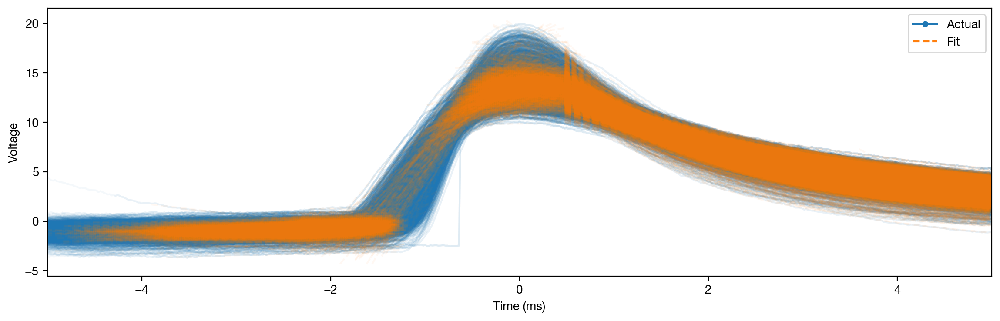

In [12]:
sp.plot()

### Filter spikes 

In [13]:
sp.filter_features()

# Save the fit for the population waveform-distance analyses
with open(os.path.join(SPE1_PICKLE_ROOT, 'spike_fit_pickles', f'c{cell_num}_spike_fit.pkl'), 'wb') as f:
    pickle.dump(sp, f)

### Get spike dataframe (with spike times column)

In [14]:

df_features = sp.df_features

#add columns for spike times, both in idx and ms
df_features['spk_times_idx'] = sp.spike_inds
df_features['spk_times_ms'] = patch_times[sp.spike_inds]
df_features['spk_id'] = range(len(df_features))

In [15]:
df_features

,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,log_isi,spk_times_idx,spk_times_ms,spk_id
0,0.242514,1.44,0.424077,19.806597,2.14,0.107242,0.624190,0.803966,-0.180664,5993,1.198027e+02,0
2,0.489392,1.18,-0.265466,19.111674,2.08,0.198566,0.681233,1.002143,0.071674,66214,1.323647e+03,1
3,-8.025866,-0.02,10.967281,10.967281,1.82,-0.061362,0.561584,0.453184,2.210913,66273,1.324827e+03,2
4,0.047178,1.22,-0.381477,18.732716,2.12,0.166378,0.615358,0.523479,-0.318966,74403,1.487349e+03,3
5,0.184438,2.22,-0.371501,16.437331,2.42,0.090110,0.572847,0.305851,0.016826,74427,1.487829e+03,4
...,...,...,...,...,...,...,...,...,...,...,...,...
11865,9.074635,0.76,9.159099,10.472358,1.02,0.121236,0.129339,-4.388164,-0.130976,80871215,1.616651e+06,9467
11868,7.669929,0.46,10.149151,10.832885,0.86,-0.091616,0.166301,-1.839216,-1.097118,80876177,1.616750e+06,9468
11869,7.669929,0.54,10.149151,10.921466,0.72,0.076233,0.163951,-2.001321,0.008393,80876181,1.616751e+06,9469
11871,2.082772,1.90,10.856786,7.708658,0.00,-0.045800,0.145662,-3.114566,-0.000208,80876282,1.616753e+06,9470


### Get spike times


In [16]:
spk_times_idx = df_features['spk_times_idx']
spk_times_ms = df_features['spk_times_ms']
spk_ids = df_features['spk_id']

In [17]:
df_features.columns

Index(['ramp_amp', 'inflection_time', 'inflection_amp', 'peak_amp',
       'peak_width', 'peak_sharpness', 'exp_lambda', 'exp_const', 'log_isi',
       'spk_times_idx', 'spk_times_ms', 'spk_id'],
      dtype='object')

## STEP 2: Cluster spike groups 

#### Plot distribution of all features

Plotting spike features...
Removing outliers using IQR method (multiplier=3)


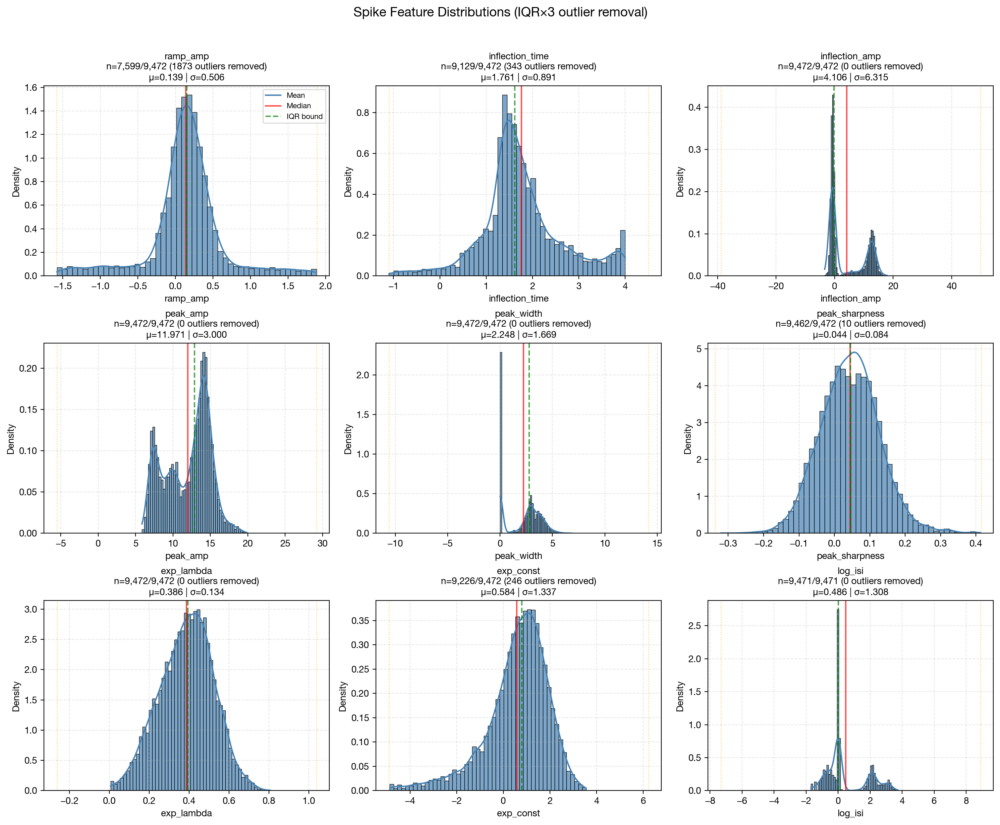


FEATURE DISTRIBUTION SUMMARY
Feature              Total N    Clean N    Outliers   % Removed  Mean       Std       
------------------------------------------------------------------------------------------
ramp_amp             9472       7599       1873       19.8       0.139      0.506     
inflection_time      9472       9129       343        3.6        1.761      0.891     
inflection_amp       9472       9472       0          0.0        4.106      6.315     
peak_amp             9472       9472       0          0.0        11.971     3.000     
peak_width           9472       9472       0          0.0        2.248      1.669     
peak_sharpness       9472       9462       10         0.1        0.044      0.084     
exp_lambda           9472       9472       0          0.0        0.386      0.134     
exp_const            9472       9226       246        2.6        0.584      1.337     
log_isi              9471       9471       0          0.0        0.486      1.308     


In [18]:
plot_spike_feature_distributions(df_features)

In [19]:
cluster_pickle = os.path.join(SPE1_PICKLE_ROOT, 'cluster_pickles', f'c{cell_num}_cluster_df.pkl')

if FORCE_CLUSTER or not os.path.exists(cluster_pickle):
    # scan all numeric features and only cluster the ones that look multimodal
    df_features_clust, rep = cluster_multimodal_features(
        df_features,
        max_k=2,
        suffix="_cluster",
        plot_each=True,  # set True if you want a quick plot per clustered feature, 
        manual_thresholds={"peak_width":3.1
        }
    )
    
    
    with open(cluster_pickle, 'wb') as f:
        pickle.dump(df_features_clust, f)
    print(f"  Saved: {os.path.basename(cluster_pickle)}")
else:
    print(f"  [cache] {os.path.basename(cluster_pickle)}")
    with open(cluster_pickle, 'rb') as f:
        df_features_clust = pickle.load(f)

  [cache] c5_cluster_df.pkl



===== CLUSTER REPORT: inflection_time_cluster =====
Found 2 clusters: ['high', 'low']

→ Determining cluster colors and labels...
  Using existing cluster labels: ['high', 'low']
  Groups: ('low', 'high')
  Group names: ('Low', 'High')

→ 1. Plotting spike waveforms by cluster


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam/patch/plts/plts.py:179: RuntimeWarning: Mean of empty slice
  avg_actual = np.nanmean(arr[:, :n], axis=0)
/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


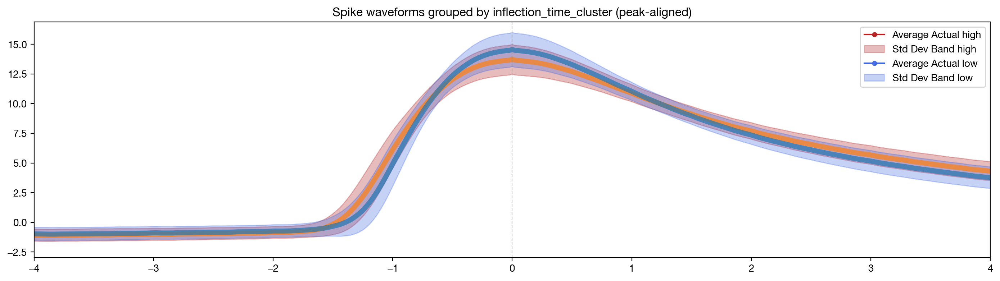


→ 1.5 Average waveforms with visual RMSE


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper_all_analyses/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:997: RuntimeWarning: Mean of empty slice
  avg_waveforms[group]    = np.nanmean(arr, axis=0)


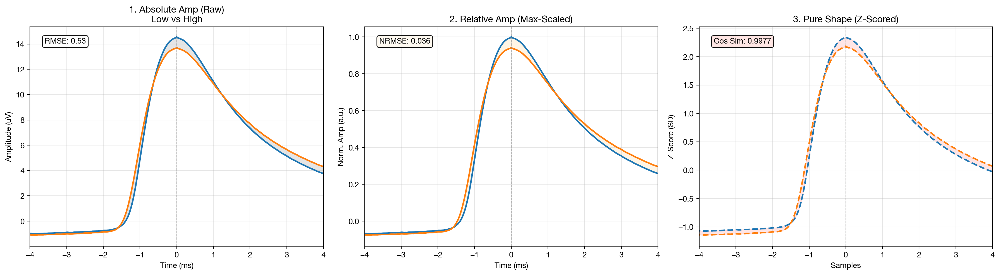


→ 2. Plotting cluster proportions over time


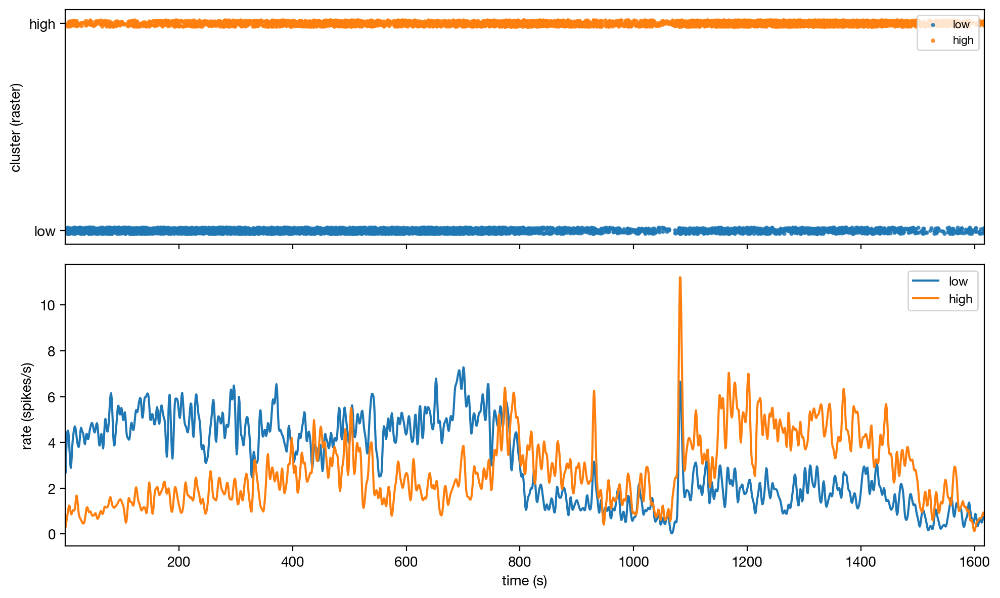


→ 3. Computing cluster transition matrix


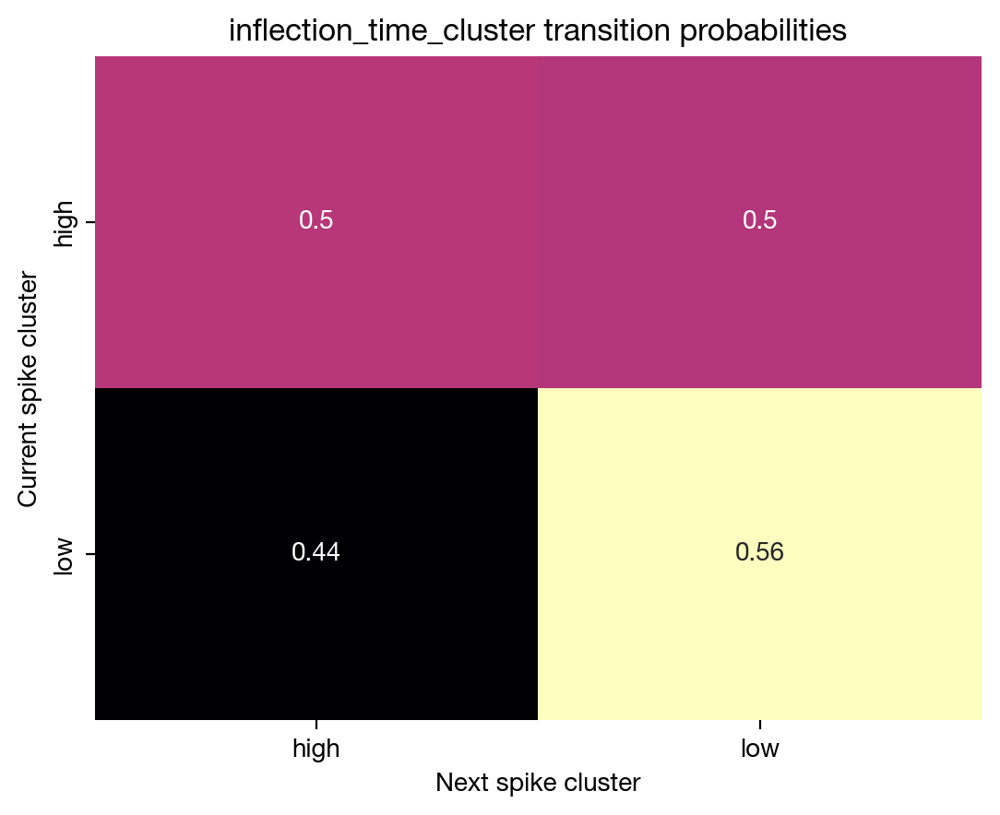


→ 4. Visualizing feature distributions by cluster


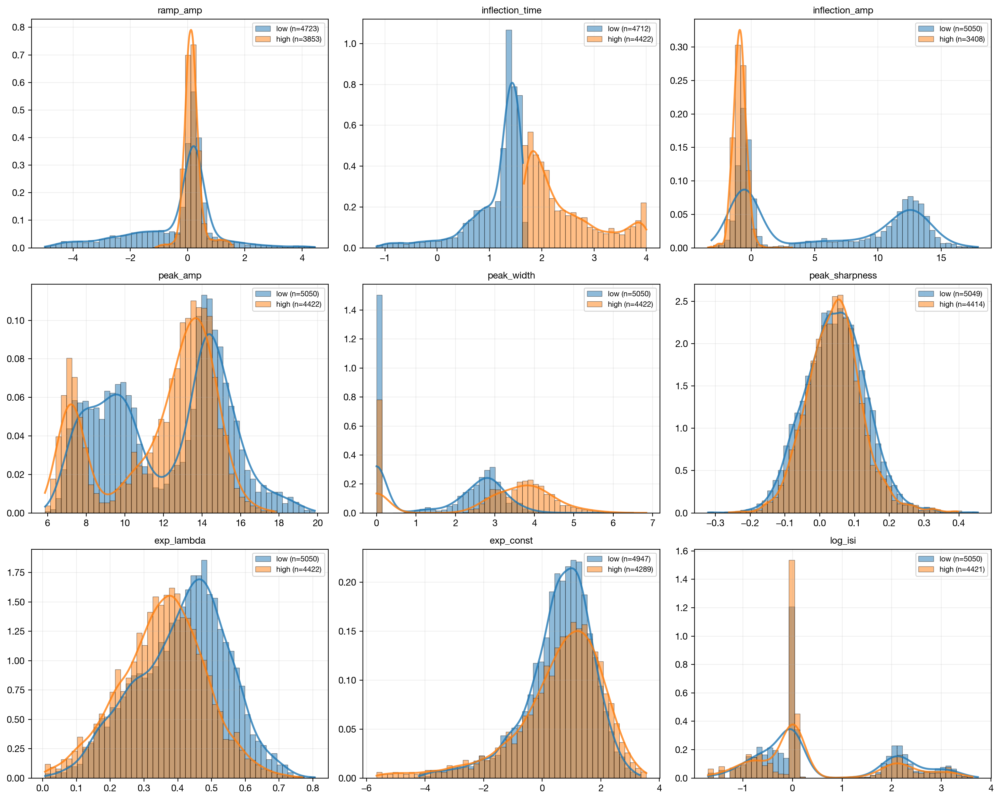


→ 5. Statistical analysis for: inflection_time
----------------------------------------

Test: Mann-Whitney U (nonparametric)
Number of groups: 2
P-value: 0.000000
Significance: ***
η² effect size: 0.402
Interpretation: Very Large


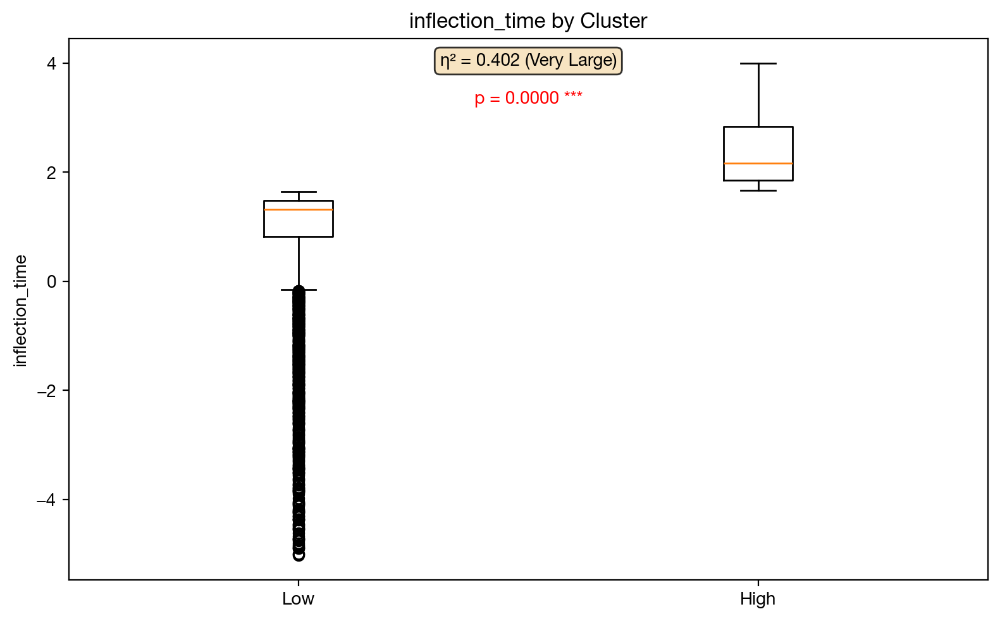


===== REPORT COMPLETE =====


===== CLUSTER REPORT: inflection_amp_cluster =====
Found 2 clusters: ['high', 'low']

→ Determining cluster colors and labels...
  Using existing cluster labels: ['high', 'low']
  Groups: ('low', 'high')
  Group names: ('Low', 'High')

→ 1. Plotting spike waveforms by cluster


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam/patch/plts/plts.py:179: RuntimeWarning: Mean of empty slice
  avg_actual = np.nanmean(arr[:, :n], axis=0)
/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


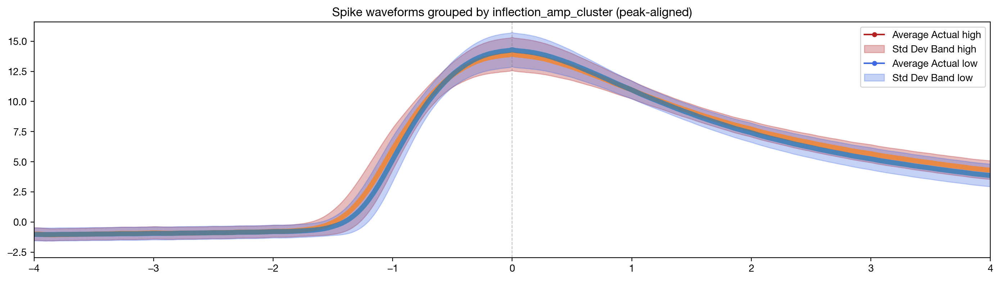


→ 1.5 Average waveforms with visual RMSE


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper_all_analyses/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:997: RuntimeWarning: Mean of empty slice
  avg_waveforms[group]    = np.nanmean(arr, axis=0)


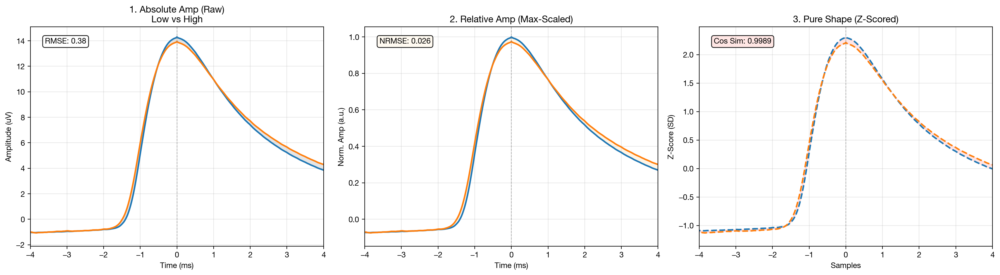


→ 2. Plotting cluster proportions over time


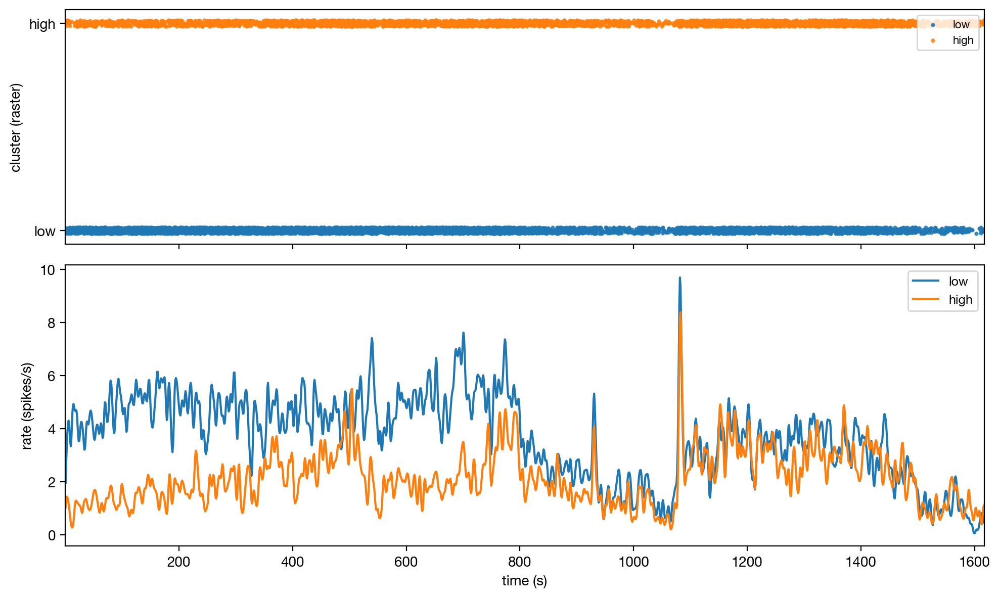


→ 3. Computing cluster transition matrix


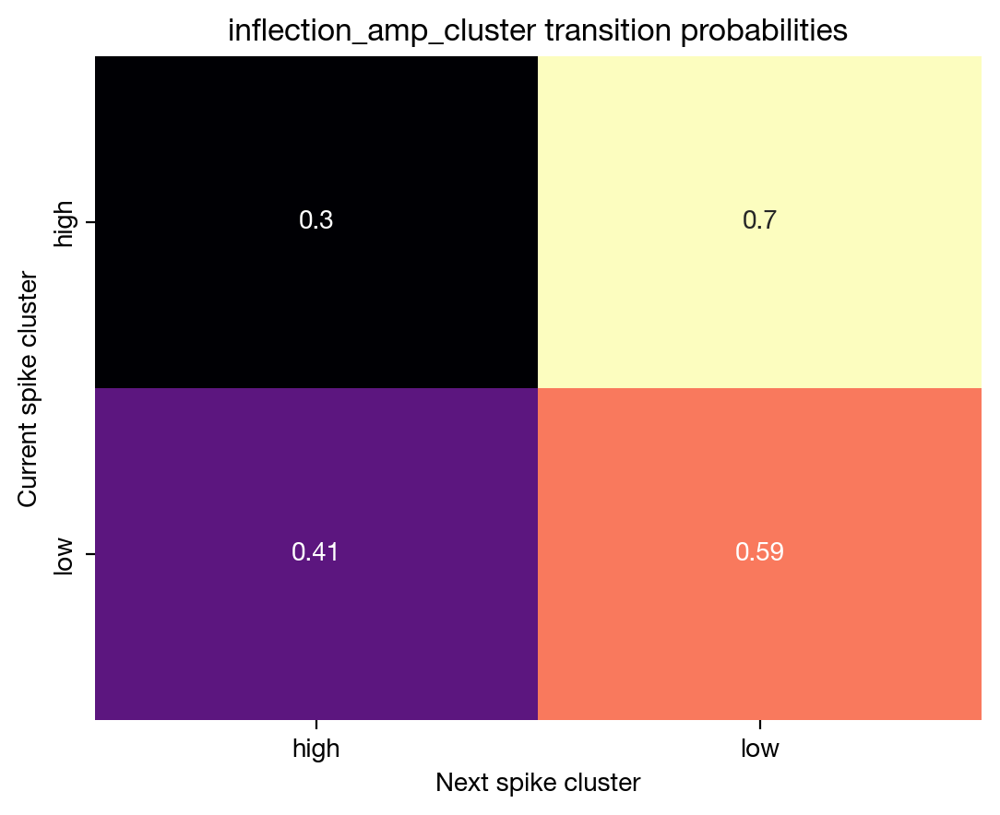


→ 4. Visualizing feature distributions by cluster


Skipping KDE for peak_width (high): Zero variance.


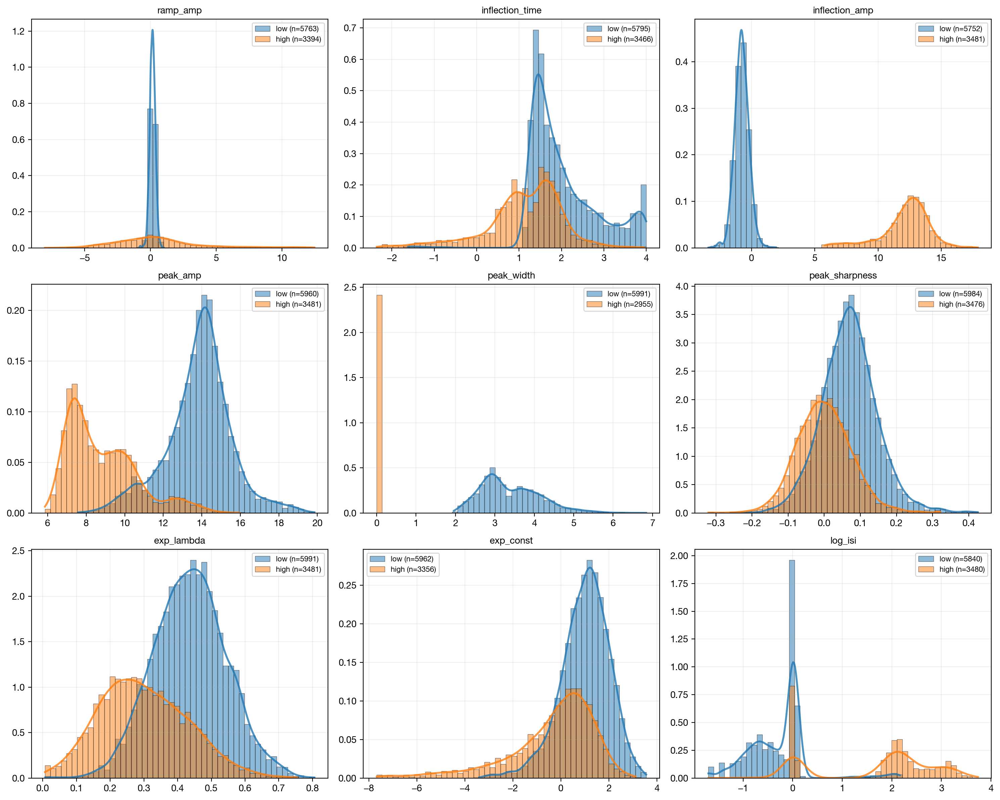


→ 5. Statistical analysis for: inflection_amp
----------------------------------------

Test: Mann-Whitney U (nonparametric)
Number of groups: 2
P-value: 0.000000
Significance: ***
η² effect size: 0.943
Interpretation: Very Large


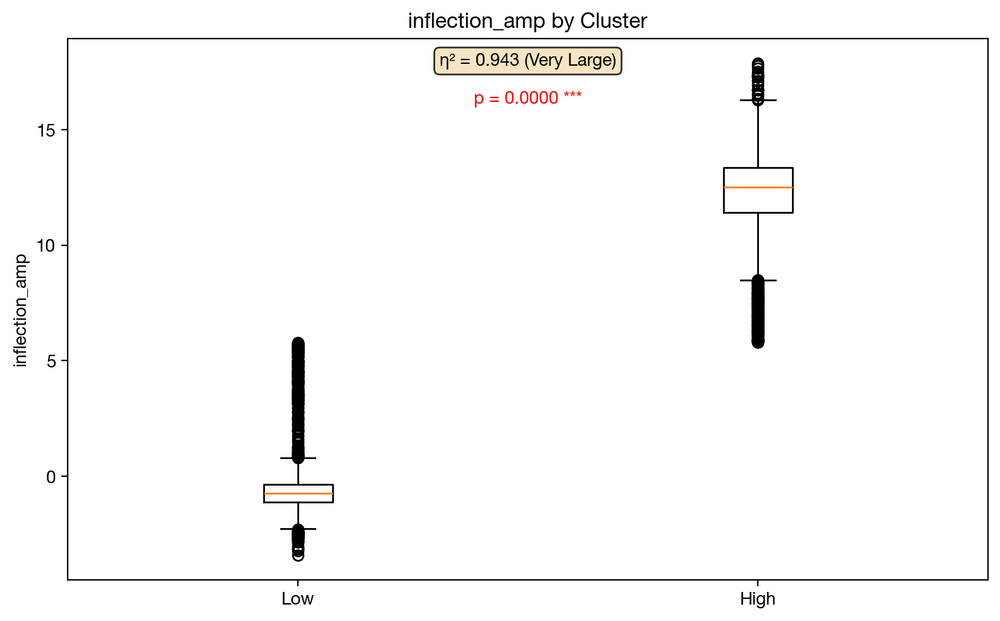


===== REPORT COMPLETE =====


===== CLUSTER REPORT: peak_amp_cluster =====
Found 2 clusters: ['high', 'low']

→ Determining cluster colors and labels...
  Using existing cluster labels: ['high', 'low']
  Groups: ('low', 'high')
  Group names: ('Low', 'High')

→ 1. Plotting spike waveforms by cluster


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam/patch/plts/plts.py:179: RuntimeWarning: Mean of empty slice
  avg_actual = np.nanmean(arr[:, :n], axis=0)
/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


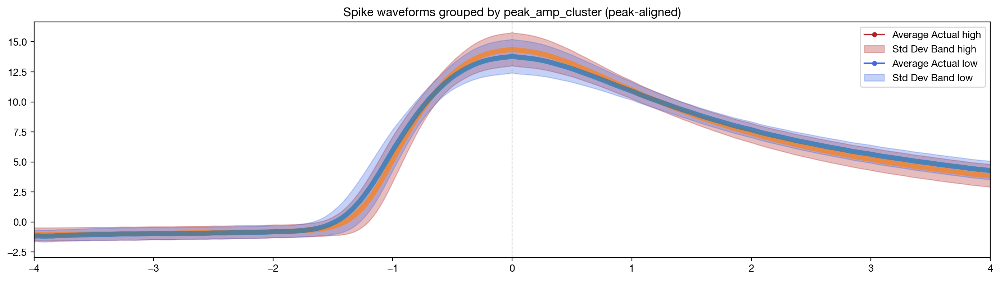


→ 1.5 Average waveforms with visual RMSE


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper_all_analyses/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:997: RuntimeWarning: Mean of empty slice
  avg_waveforms[group]    = np.nanmean(arr, axis=0)


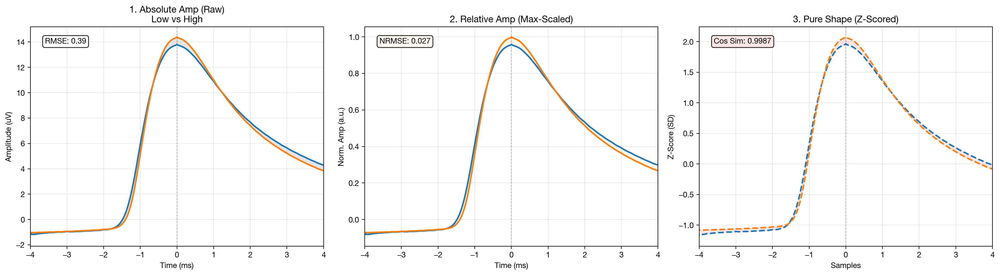


→ 2. Plotting cluster proportions over time


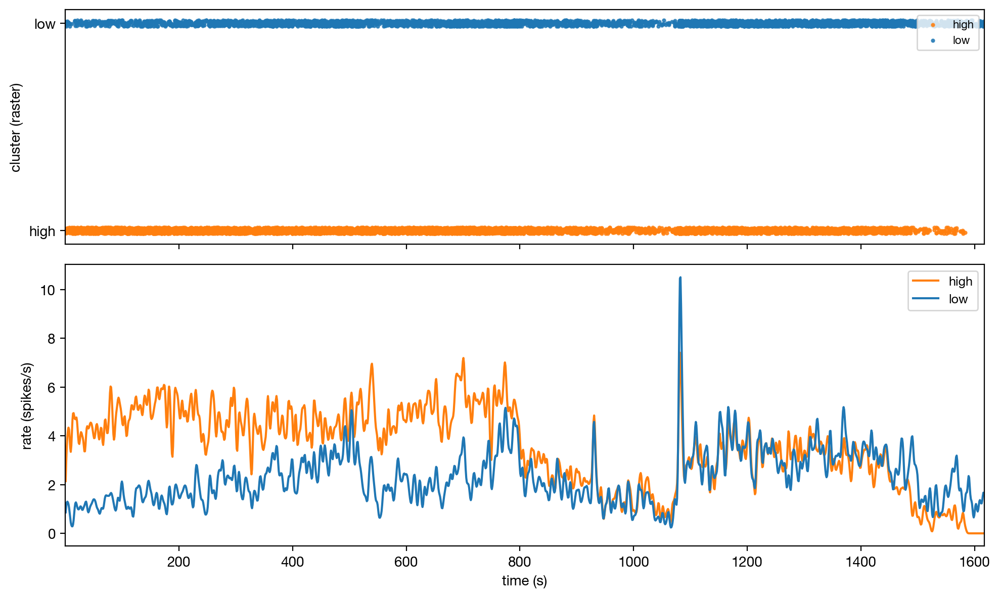


→ 3. Computing cluster transition matrix


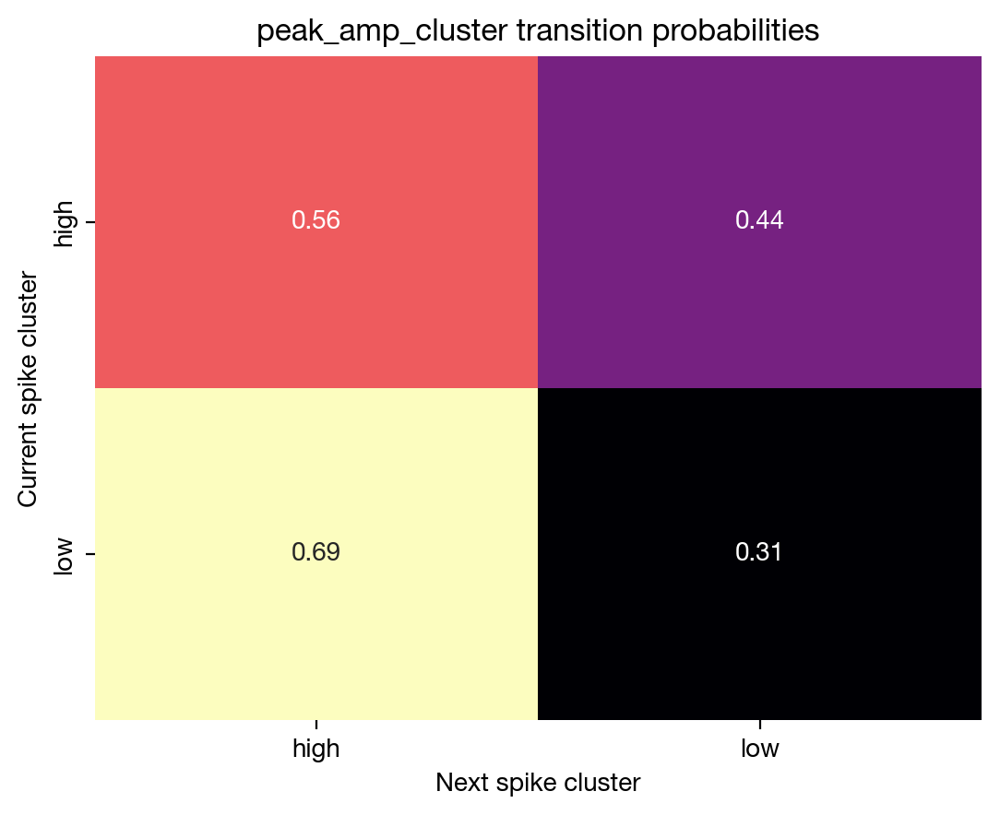


→ 4. Visualizing feature distributions by cluster


Skipping KDE for peak_width (low): Zero variance.


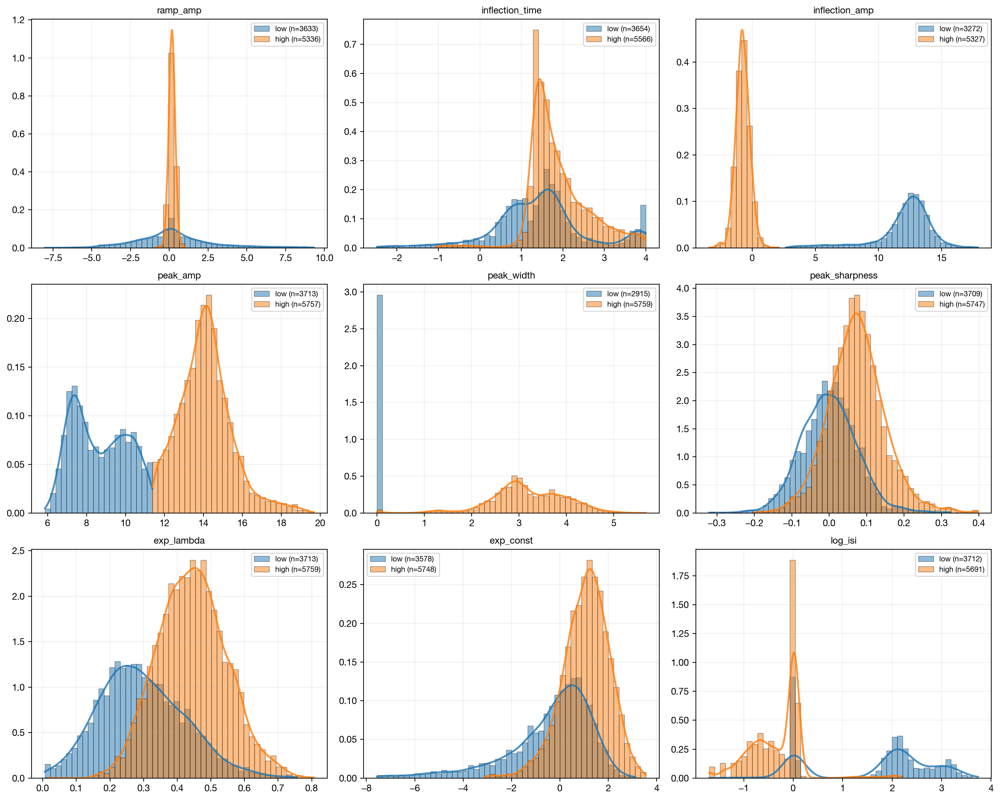


→ 5. Statistical analysis for: peak_amp
----------------------------------------

Test: Mann-Whitney U (nonparametric)
Number of groups: 2
P-value: 0.000000
Significance: ***
η² effect size: 0.787
Interpretation: Very Large


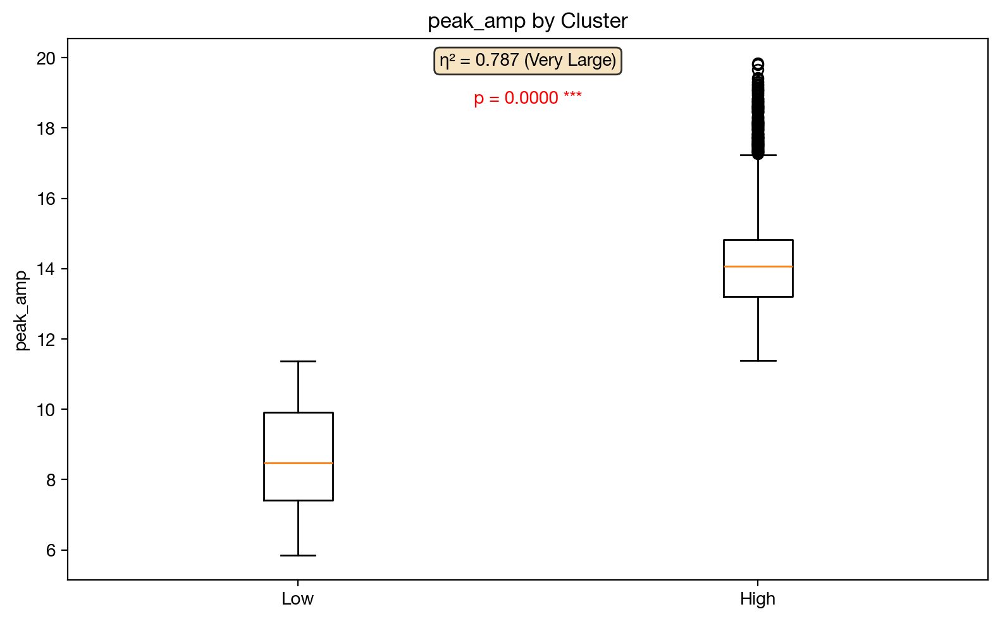


===== REPORT COMPLETE =====


===== CLUSTER REPORT: peak_width_cluster =====
Found 2 clusters: ['high', 'low']

→ Determining cluster colors and labels...
  Using existing cluster labels: ['high', 'low']
  Groups: ('low', 'high')
  Group names: ('Low', 'High')

→ 1. Plotting spike waveforms by cluster


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam/patch/plts/plts.py:179: RuntimeWarning: Mean of empty slice
  avg_actual = np.nanmean(arr[:, :n], axis=0)
/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


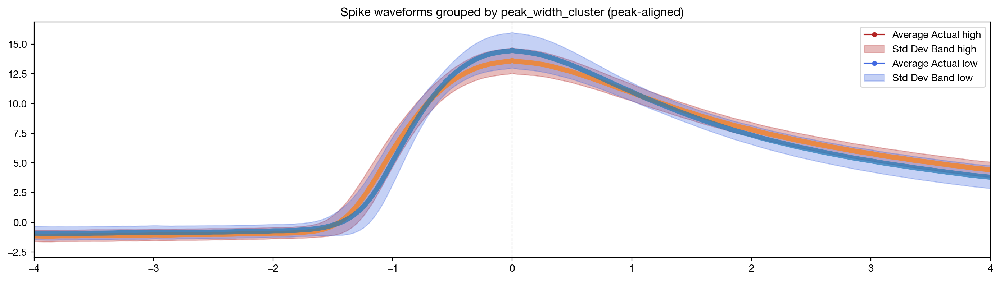


→ 1.5 Average waveforms with visual RMSE


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper_all_analyses/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:997: RuntimeWarning: Mean of empty slice
  avg_waveforms[group]    = np.nanmean(arr, axis=0)


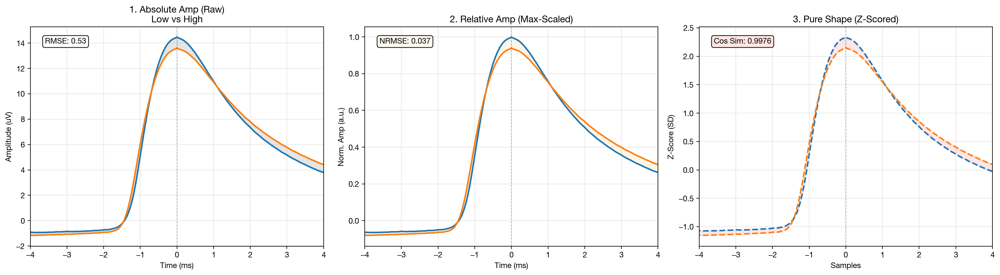


→ 2. Plotting cluster proportions over time


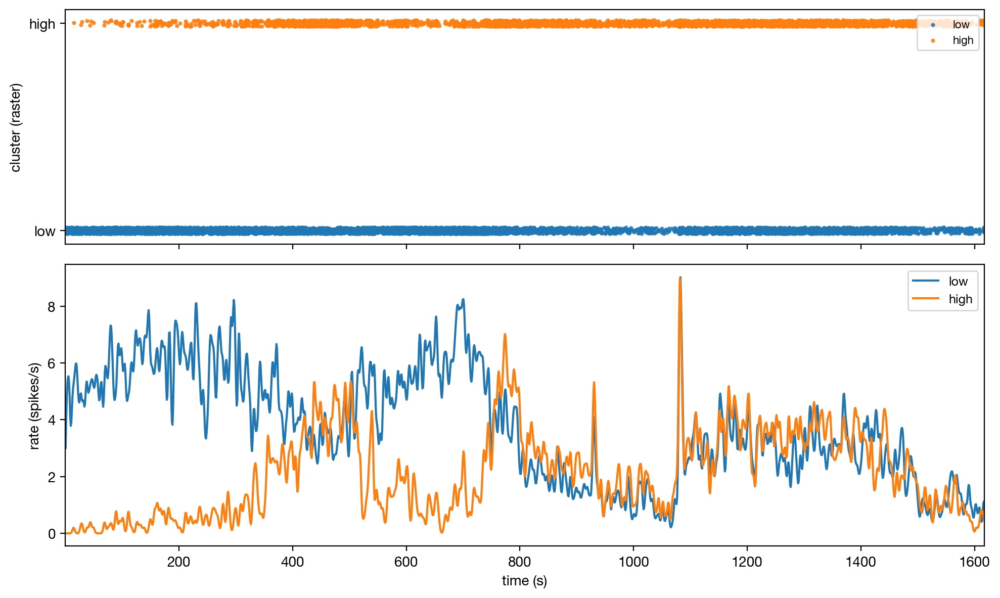


→ 3. Computing cluster transition matrix


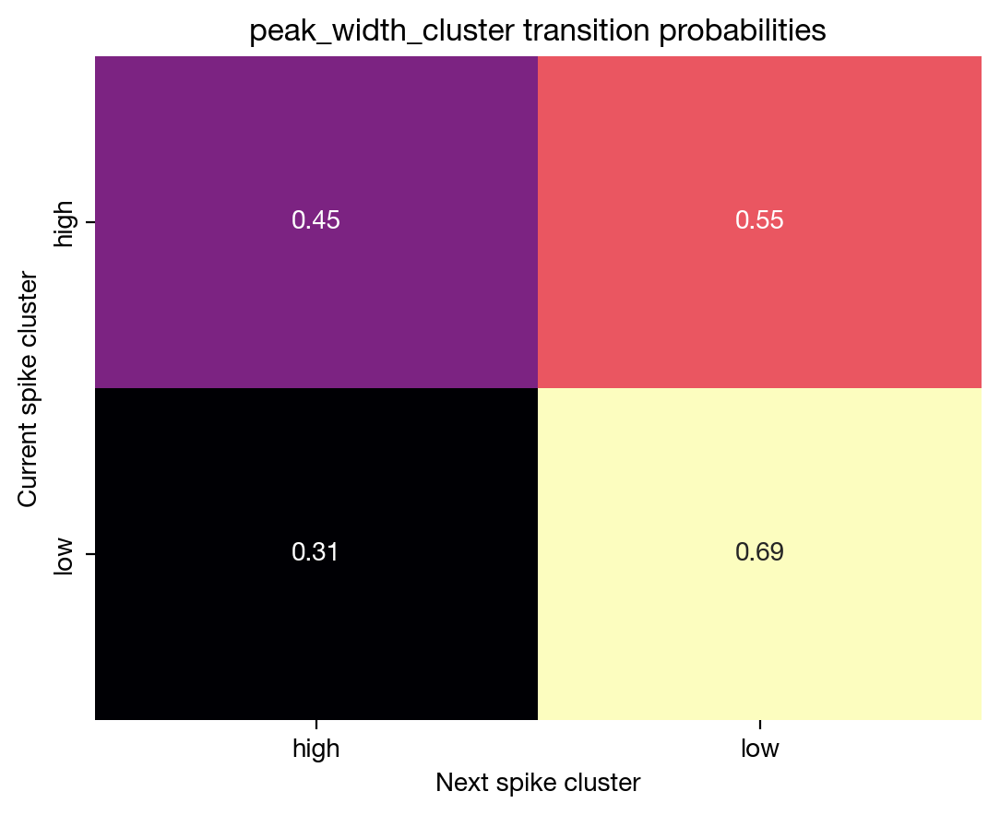


→ 4. Visualizing feature distributions by cluster


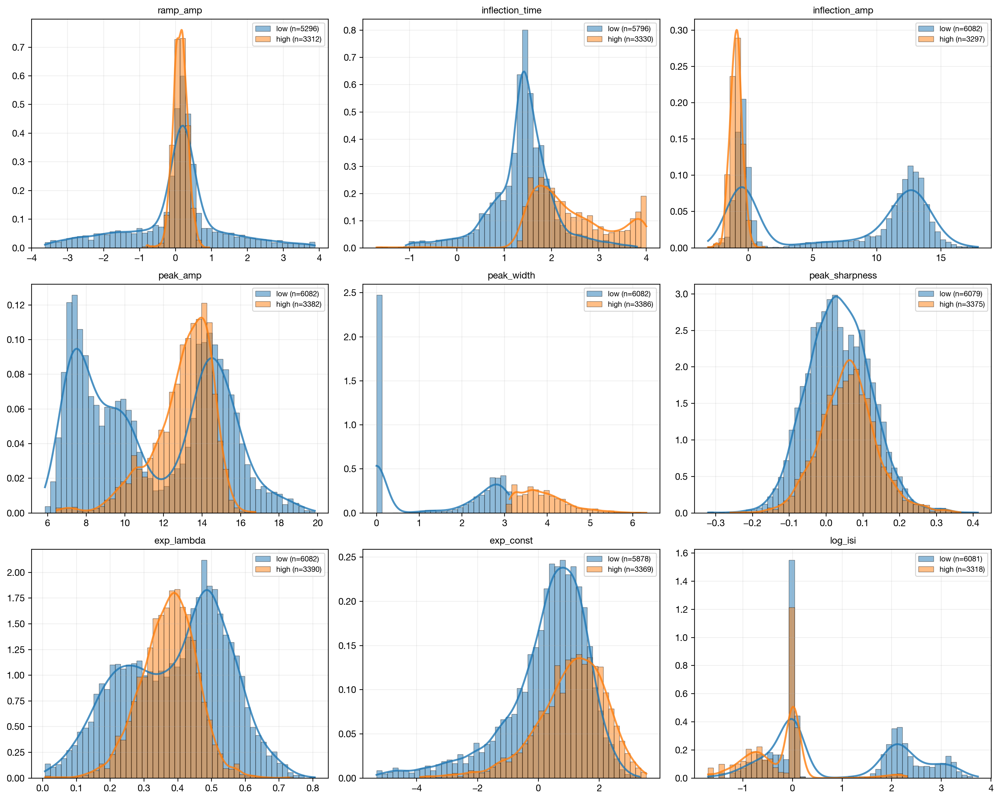


→ 5. Statistical analysis for: peak_width
----------------------------------------

Test: Mann-Whitney U (nonparametric)
Number of groups: 2
P-value: 0.000000
Significance: ***
η² effect size: 0.547
Interpretation: Very Large


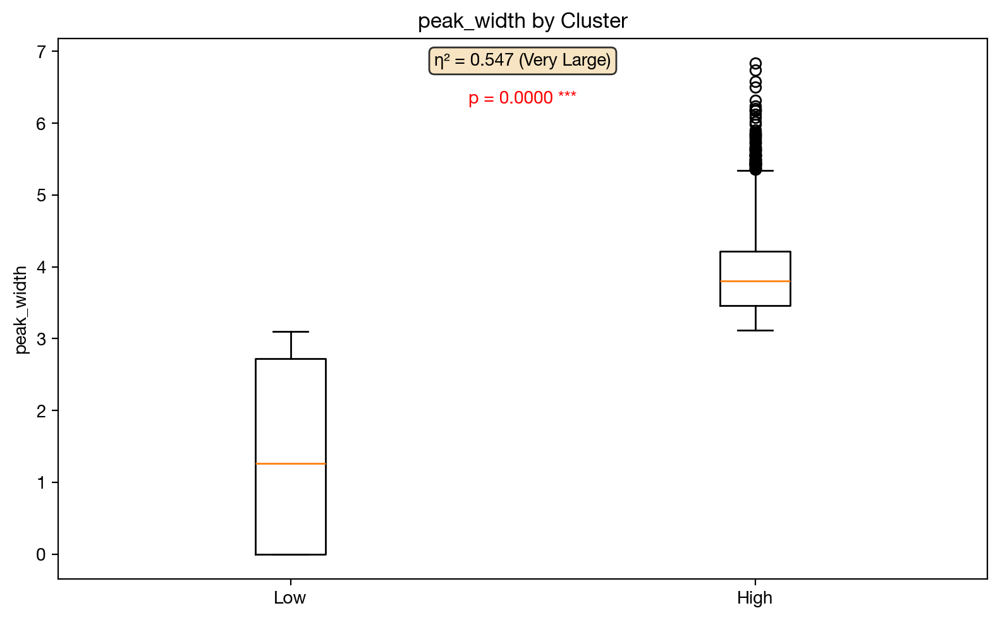


===== REPORT COMPLETE =====


===== CLUSTER REPORT: peak_sharpness_cluster =====
Found 2 clusters: ['high', 'low']

→ Determining cluster colors and labels...
  Using existing cluster labels: ['high', 'low']
  Groups: ('low', 'high')
  Group names: ('Low', 'High')

→ 1. Plotting spike waveforms by cluster


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam/patch/plts/plts.py:179: RuntimeWarning: Mean of empty slice
  avg_actual = np.nanmean(arr[:, :n], axis=0)
/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


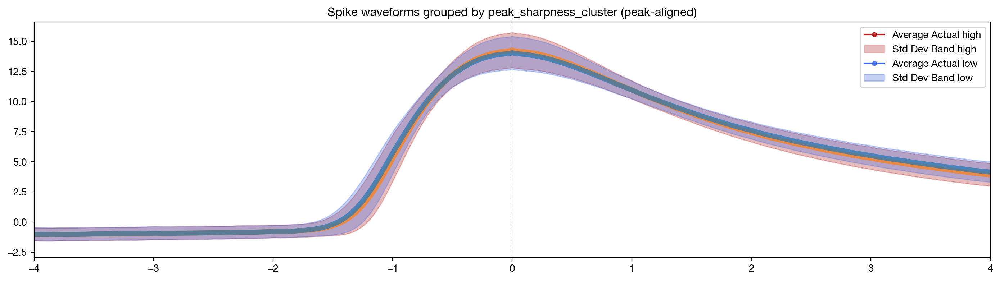


→ 1.5 Average waveforms with visual RMSE


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper_all_analyses/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:997: RuntimeWarning: Mean of empty slice
  avg_waveforms[group]    = np.nanmean(arr, axis=0)


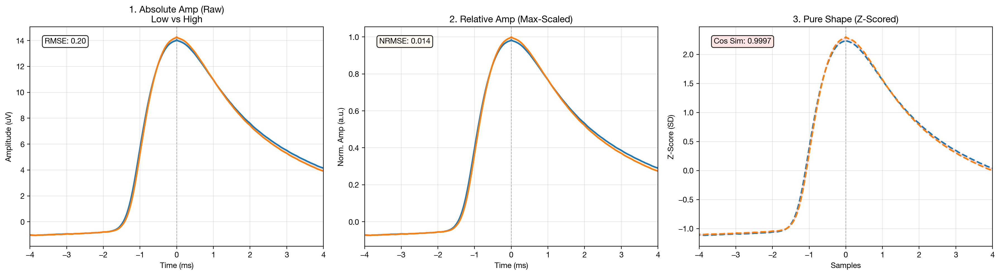


→ 2. Plotting cluster proportions over time


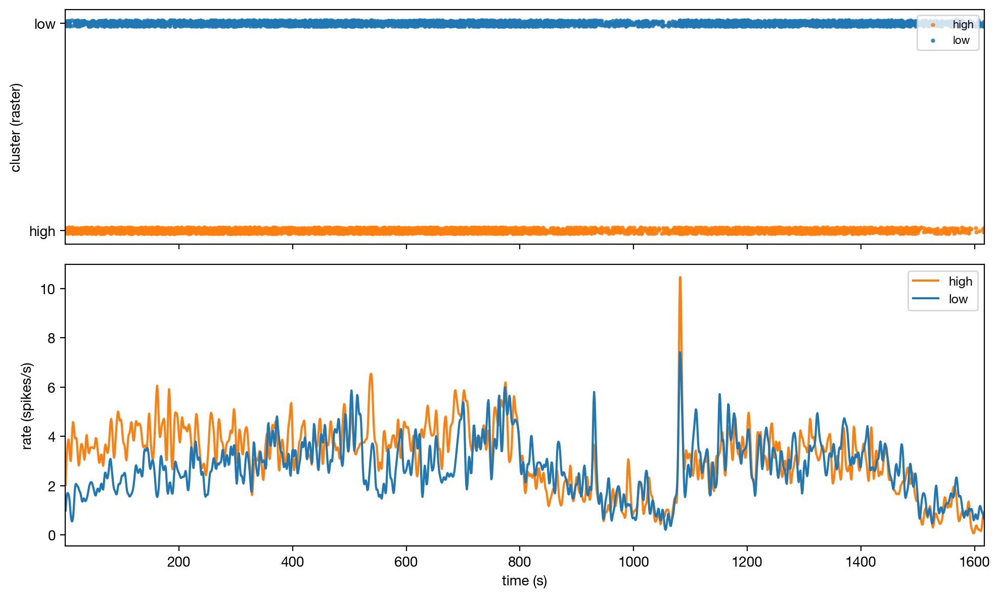


→ 3. Computing cluster transition matrix


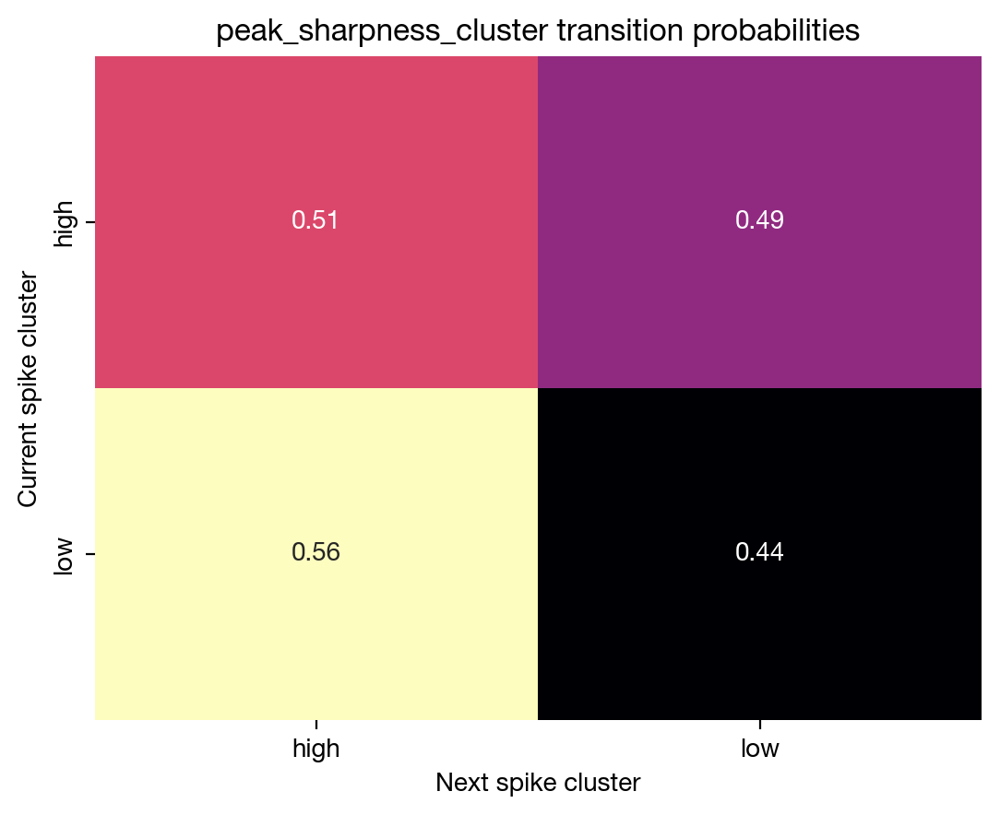


→ 4. Visualizing feature distributions by cluster


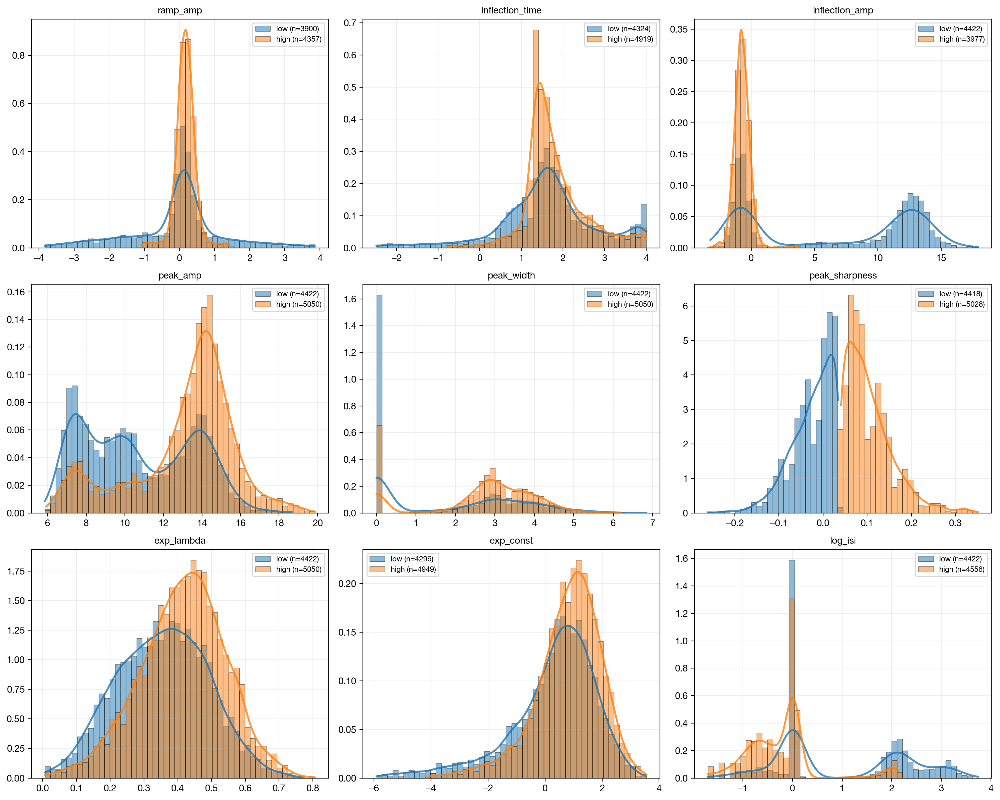


→ 5. Statistical analysis for: peak_sharpness
----------------------------------------

Test: Mann-Whitney U (nonparametric)
Number of groups: 2
P-value: 0.000000
Significance: ***
η² effect size: 0.604
Interpretation: Very Large


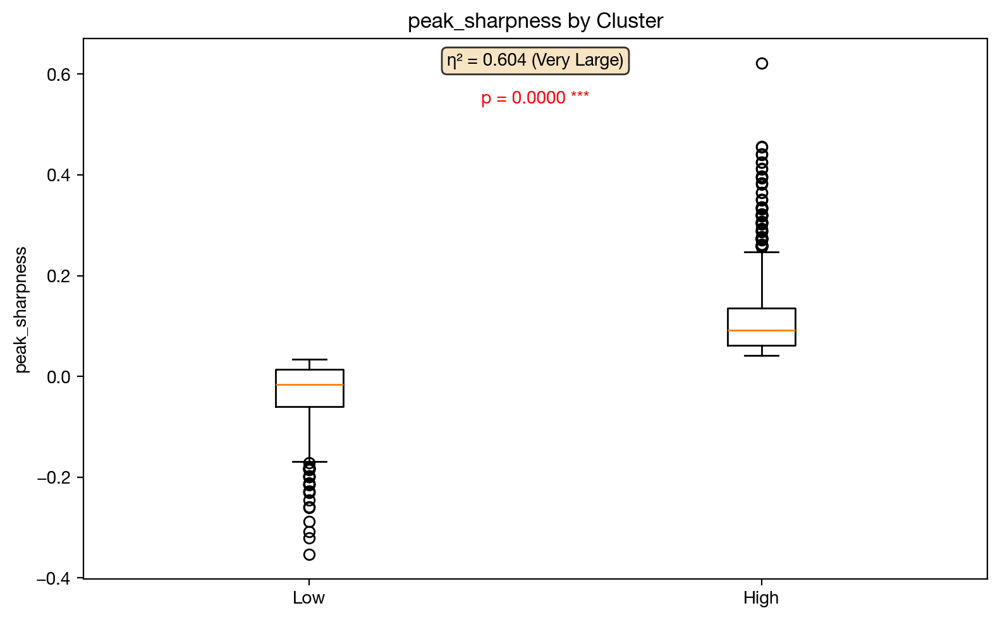


===== REPORT COMPLETE =====


===== CLUSTER REPORT: log_isi_cluster =====
Found 2 clusters: ['high', 'low']

→ Determining cluster colors and labels...
  Using existing cluster labels: ['high', 'low']
  Groups: ('low', 'high')
  Group names: ('Low', 'High')

→ 1. Plotting spike waveforms by cluster


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam/patch/plts/plts.py:179: RuntimeWarning: Mean of empty slice
  avg_actual = np.nanmean(arr[:, :n], axis=0)
/Users/blancamartin/opt/anaconda3/envs/spikeparam/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


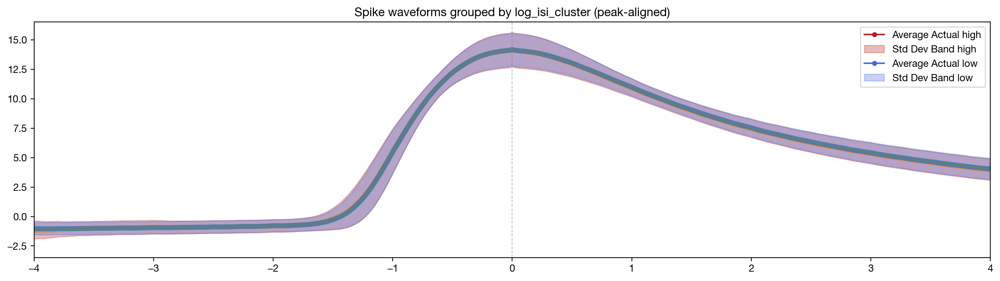


→ 1.5 Average waveforms with visual RMSE


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper_all_analyses/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:997: RuntimeWarning: Mean of empty slice
  avg_waveforms[group]    = np.nanmean(arr, axis=0)


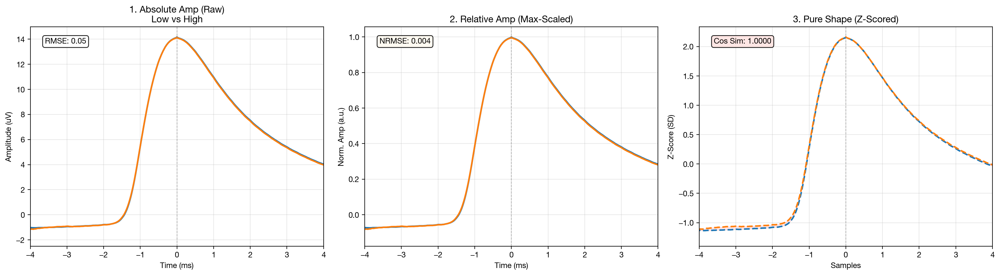


→ 2. Plotting cluster proportions over time


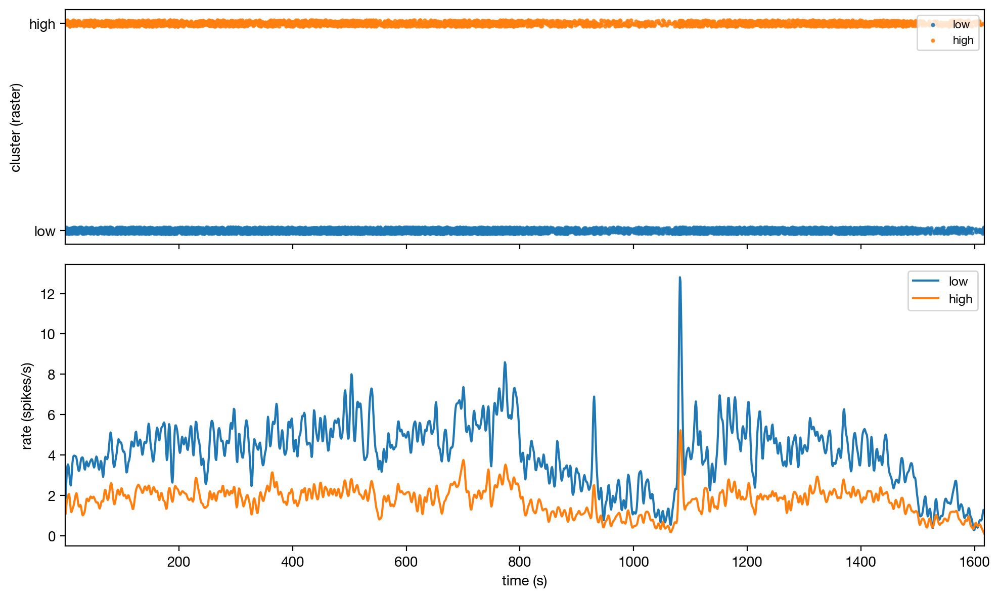


→ 3. Computing cluster transition matrix


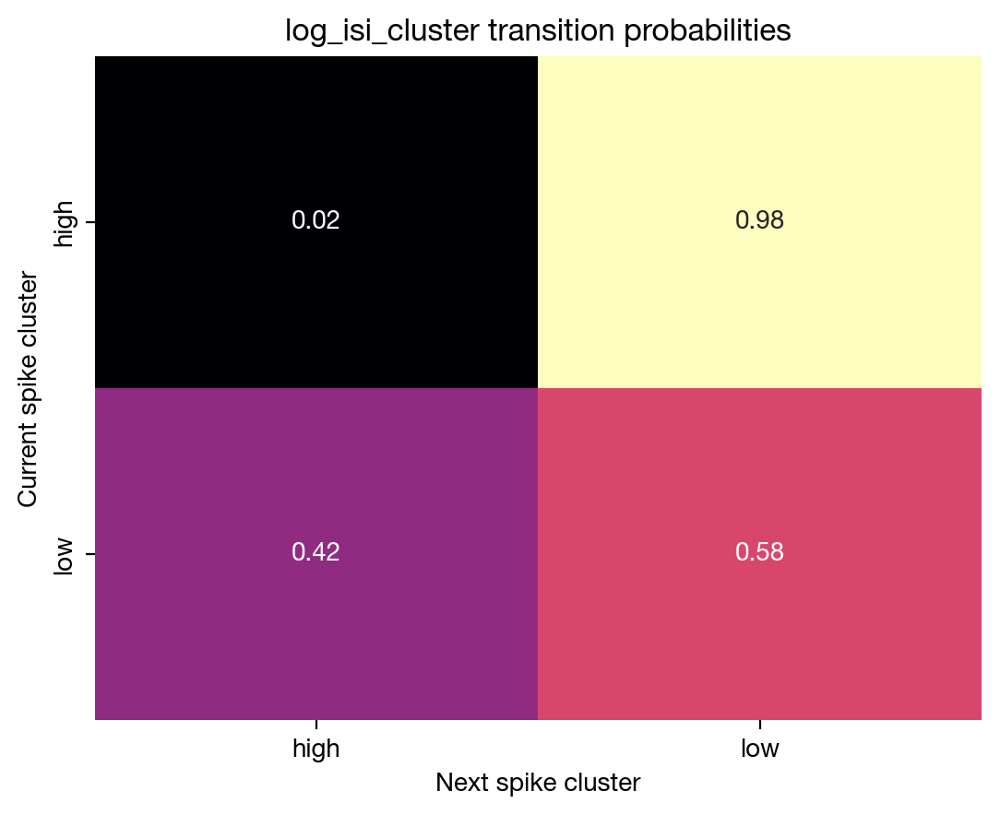


→ 4. Visualizing feature distributions by cluster


Skipping KDE for peak_width (high): Zero variance.


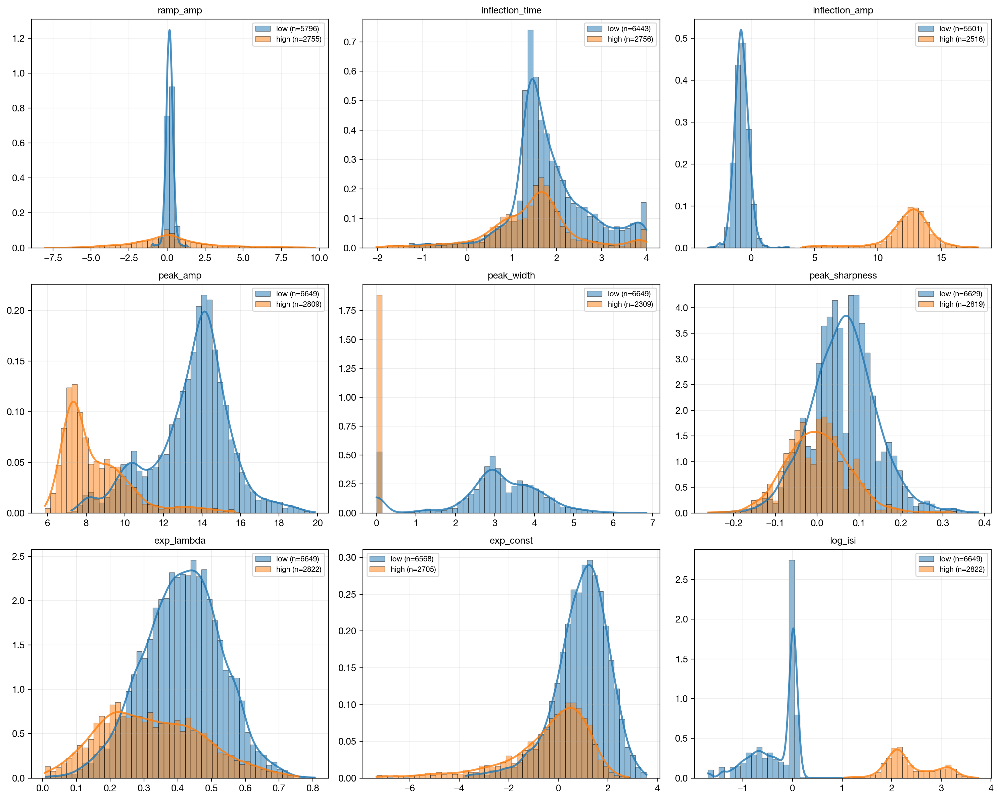


→ 5. Statistical analysis for: log_isi
----------------------------------------

Test: Mann-Whitney U (nonparametric)
Number of groups: 2
P-value: 0.000000
Significance: ***
η² effect size: 0.875
Interpretation: Very Large


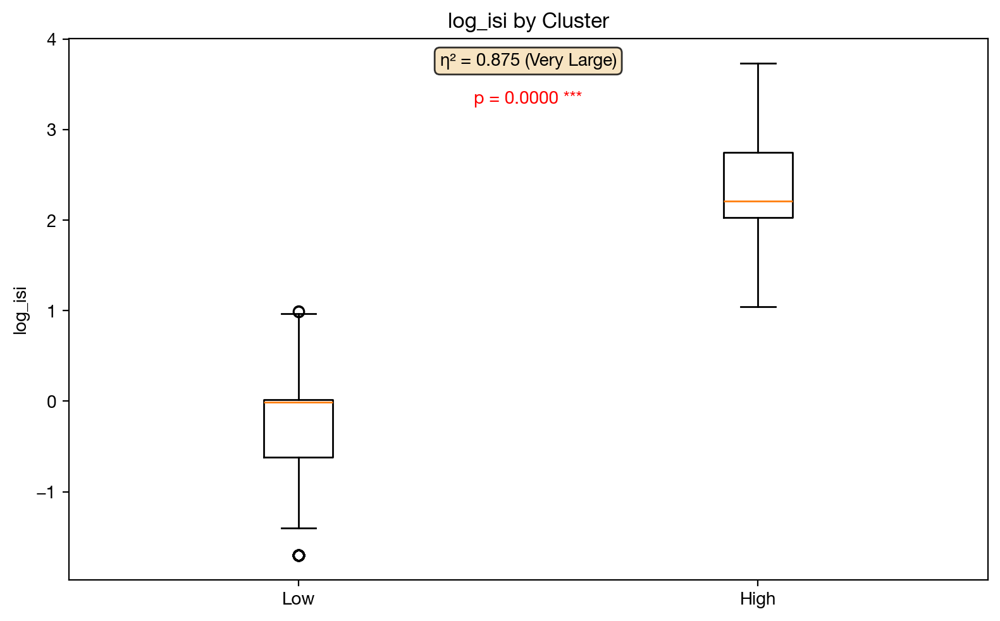


===== REPORT COMPLETE =====



In [20]:
all_reports = []

# Filter columns first to ensure the index is continuous
cluster_cols = [c for c in df_features_clust.columns if c.endswith("_cluster")]

for i, col in enumerate(cluster_cols):
    # Pass 'i' as the cluster_group_id
    row_df = plot_full_cluster_report(df_features_clust, sp, col, cluster_group_id=i)
    all_reports.append(row_df)

# Final Master DataFrame
master_report_df = pd.concat(all_reports, ignore_index=True)

In [21]:
# Save cluster quality report for population-level comparison analysis
report_pickle = os.path.join(SPE1_PICKLE_ROOT, 'cluster_pickles', f'c{cell_num}_cluster_report.pkl')
with open(report_pickle, 'wb') as f:
    pickle.dump(master_report_df, f)


In [22]:
# Compute and save peak-aligned average waveforms for each cluster group.
# Saved to a lightweight pickle used by the population comparison notebook.
wf_pickle = os.path.join(SPE1_PICKLE_ROOT, 'cluster_pickles', f'c{cell_num}_cluster_waveforms.pkl')
if FORCE_CLUSTER or not os.path.exists(wf_pickle):
    cluster_cols = [c for c in df_features_clust.columns if c.endswith('_cluster')]
    wf_data = compute_cluster_waveforms(sp, df_features_clust, cluster_cols)
    with open(wf_pickle, 'wb') as f:
        pickle.dump(wf_data, f)
    print(f"  Saved: {os.path.basename(wf_pickle)}")
else:
    print(f"  [cache] {os.path.basename(wf_pickle)}")


  [cache] c5_cluster_waveforms.pkl
